# UDD - Master in Data Science 
## NS101 - Networking Science
### Professor: Cristian Candia-Castro Vallejos $^{1,2}$
[1] Centro de Investigación en Complejidad Social, Universidad del Desarrollo, Santiago, Chile.<br>
[2] Collective Learning Group, MIT Media Lab, Cambridge, Massachusetts, USA
# <span class="mark">WorldWide Air Transportation Networking Project</span>
<p><img src="./images/NS101_Project_portada_2.png" ></p>

### Developed by Marcelo Jose Rovai
#### December, 2018
---

### Resourses: 
- [1. Networking Science](http://networksciencebook.com/)
- [2.  Think Complexity](http://greenteapress.com/complexity2/thinkcomplexity2.pdf)
- [3.  IPython Cookbook, Second Edition](https://ipython-books.github.io)
- [4.  The worldwide air transportation network: Anomalous centrality, community structure, and cities' global roles](https://www.pnas.org/content/102/22/7794)
- [5.  Revealing the structure of the world airline network](https://www.nature.com/articles/srep05638.pdf)
- [6.  Modelling the Air Transport with Complex Networks: a short review](https://arxiv.org/pdf/1302.7017.pdf)
- [7.  Reliability Analysis for Aviation Airline Network Based on Complex Network](http://www.scielo.br/pdf/jatm/v6n2/2175-9146-jatm-06-02-0193.pdf)
- [8.  Finding The Shortest Path, With A Little Help From Dijkstra](https://medium.com/basecs/finding-the-shortest-path-with-a-little-help-from-dijkstra-613149fbdc8e)
- [9. An Introduction to Graph Theory and Network Analysis ](https://www.analyticsvidhya.com/blog/2018/04/introduction-to-graph-theory-network-analysis-python-codes/)
- [10. Catching that flight: Visualizing social network with Networkx and Basemap](https://towardsdatascience.com/catching-that-flight-visualizing-social-network-with-networkx-and-basemap-ce4a0d2eaea6)
- [11.The Hidden Geometry of Complex, Network-Driven Contagion Phenomena](https://www.researchgate.net/publication/259322075_The_Hidden_Geometry_of_Complex_Network-Driven_Contagion_Phenomena)
---

### Datasets
From: https://openflights.org/data.html<br>
As of January 2017, the OpenFlights Airports Database contains over 10,000 airports.<br>
As of June 2014, the OpenFlights/Airline Route Mapper Route Database contains 67663 routes between 3321 airports on 548 airlines spanning the globe.
- https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat
- https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat
---

### Important Libraries

In [48]:
from math import radians, cos, sin, sqrt, atan2
import numpy as np
import pandas as pd
import networkx as nx
import community
import powerlaw
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
#import matplotlib as mpl
import seaborn as sns
sns.set()
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

### Useful functions developed for Networking Analysis

In [5]:
def sample_path_lengths(G, trials=1000):
    nodes = list(G)
    pairs = np.random.choice(nodes, (trials, 2))
    lengths = [nx.shortest_path_length(G, *pair) for pair in pairs]
    return lengths


def sample_clusters(G, trials=1000):
    clusters = []
    dg_samples = []
    nodes = np.random.choice(list(G), trials)
    for i in nodes:
        cl_i = nx.clustering(G, i)
        dg_i = G.degree(i)
        clusters.append(cl_i)
        dg_samples.append(dg_i)
    return clusters, dg_samples


def large_network_analysis(G, trials=1000):
    N = len(G)
    L = G.size()
    degrees = list(dict(G.degree()).values())
    kmin = min(degrees)
    kmax = max(degrees)
    kmean = round(2 * L / N)
    clusters, dg_samples = sample_clusters(G, trials)
    aveC = round(np.mean(clusters), 2)
    paths = sample_path_lengths(G, trials)
    aveL = round(np.mean(paths), 2)
    dmax = max(paths)

    print("==> [Network General info] <==\n")
    print("Number of Nodes (N): ", N)
    print("Number of Links (L): ", L)
    print("Min Degree     kmin: ", kmin)
    print("Max Degree     kmax: ", kmax)
    print("Mean Degree     <k>: ", kmean)
    print("Ave Short Path  <d>: ", aveL)
    print("Diameter       dmax: ", dmax)
    print("Ave Clustering  <C>: ", aveC)

    return N, L, kmin, kmax, kmean, aveC, aveL, dmax, degrees, paths, clusters, dg_samples


def plot_k_distr(degrees):
    bin_edges = np.logspace(
        np.log10(min(degrees)), np.log10(max(degrees)), num=1000)
    density, _ = np.histogram(degrees, bins=bin_edges, density=True)
    prob = density / sum(density)
    log_be = np.log10(bin_edges)
    x = 10**((log_be[1:] + log_be[:-1]) / 2)
    plt.title('k Degree distribtion', fontsize=16)
    plt.xlabel(r"$k$", fontsize=16)
    plt.ylabel(r"$P(k)$", fontsize=16)
    plt.loglog(x, prob, marker='o', linestyle='none')
    

def fit_power_law(data, label, xmin=None, xmax=None):   
    fit = powerlaw.Fit(data, xmin, xmax)
    alpha = round(fit.power_law.alpha, 2)
    fig = fit.plot_ccdf(linewidth=3, label=label);
    fit.power_law.plot_ccdf(ax=fig, color='r', linestyle='--', label='Power law fit');
    plt.title('k Degree distribtion', fontsize=16)
    plt.xlabel(r"$k$", fontsize=16)
    plt.ylabel(r"$P(k)$", fontsize=16)
    handles, labels = fig.get_legend_handles_labels()
    fig.legend(handles, labels, loc=3)
    print("Degree Exponent:", alpha)
    return alpha


def plot_path(paths):
    freq, _ = np.histogram(paths, bins=int(max(paths)) + 1)
    print("kmean = ", round(np.mean(paths), 2))
    prob = freq / sum(freq)
    plt.title('Short Path Distribution', fontsize=16)
    plt.ylabel('P(d)', fontsize=16)
    plt.xlabel('d', fontsize=16)
    plt.bar(range(len(freq)), prob, tick_label=list(range(len(freq))))


def plot_cluster(clusters, degrees):
    plt.title('Clustering coef. v/s node degree', fontsize=16)
    plt.ylabel(r"$C(k)$", fontsize=16)
    plt.xlabel(r"$k$", fontsize=16)
    ls = np.logspace(-2, 0, 10)
    plt.xscale('log')
    plt.yscale('log')
    plt.scatter(degrees, clusters)
    #plt.xlim([1, 1000])
    plt.ylim([0.001, 10])

### Load Datasets

In [6]:
!ls ./data/*.dat

./data/airports.dat ./data/routes.dat


`Get Airports`

In [7]:
airport_col = [
    'id', 'name', 'city', 'country', 'iata', 'icao', 'lat', 'lon', 'alt',
    'timezone', 'dst', 'tz', 'type', 'source'
]

airports = pd.read_csv("./data/airports.dat", names=airport_col, index_col=4)
airports.shape

(7184, 13)

In [8]:
airports.sample(2)

,id,name,city,country,icao,lat,lon,alt,timezone,dst,tz,type,source
iata,,,,,,,,,,,,,
DSK,5943,Dera Ismael Khan Airport,Dera Ismael Khan,Pakistan,OPDI,31.909401,70.896599,594,5,N,Asia/Karachi,airport,OurAirports
ABL,7177,Ambler Airport,Ambler,United States,PAFM,67.106300,-157.856995,334,-9,A,America/Anchorage,airport,OurAirports


`Get Routes`

In [9]:
route_cols = [
    'airline', 'airline_id', 'source', 'source_id', 'dest', 'dest_id',
    'codeshare', 'stops', 'equipment'
]
routes = pd.read_csv("./data/routes.dat", names=route_cols)
routes.shape

(67663, 9)

In [10]:
routes.sample(2)

,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment
33325,IOS,2951,NJC,2972,OVB,4078,NaN,0,CR2
43665,NS,16136,KMG,3382,SJW,6347,NaN,0,73G


### Clean Routes Dataset 

`Let's connect the routes with airport 

In [11]:
routes = routes[routes['source'].isin(airports.index)
                & routes['dest'].isin(airports.index)]
routes.shape

(66067, 9)

In [12]:
routes.stops.value_counts()

0    66056
1       11
Name: stops, dtype: int64

`Let's only consider non stop destinations`

In [13]:
routes = routes[routes.stops == 0]
routes.shape

(66056, 9)

`Deleting no important columns:`

In [14]:
del routes['airline_id']
del routes['source_id']
del routes['dest_id']
del routes['codeshare']
del routes['stops']

`Let's create a new column "dist", with the aprox. distance in kilometers of any route`
- First create a dictionary with airport positions (LAT, LONG) starting from its IATA code
- Second create a function to calculate distance between airports
- Third, apply the function to dataset to calculate distance for all rows

In [15]:
pos = {
    airport: (v['lon'], v['lat'])
    for airport, v in airports.to_dict('index').items()
}

In [16]:
def get_dist_airports(pos, airp1, airp2):
    '''
    Distance between two airports in km using the Haversine formula
    Input parameters are IATA 3 digits code
    Return round value in Kilometers
    '''
    lng1, lat1 = pos[airp1]
    lng2, lat2 = pos[airp2]

    r = 6371  # radius of the earth in km
    lat1 = radians(lat1)
    lat2 = radians(lat2)
    lng1 = radians(lng1)
    lng2 = radians(lng2)
    lat_dif = lat2 - lat1
    lng_dif = lng2 - lng1
    a = sin(lat_dif / 2.0)**2 + cos(lat1) * cos(lat2) * sin(lng_dif / 2.0)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    d = r * c
    return round(d)

`Testing the function`

`Is possible to verify the name of airport = IATA code here: https://www.world-airport-codes.com/`

In [17]:
airp1 = "SCL" # Santiago, Chile
airp2 = "GRU" # Sao Paulo Brazil
get_dist_airports(pos, airp1, airp2)

2614

In [18]:
airp1 = "BSB" # Brasilia, Brazil
airp2 = "GRU" # Sao Paulo, Brazil
get_dist_airports(pos, airp1, airp2)

855

In [19]:
def calc_dist(row):
    return get_dist_airports(pos, row['source'], row['dest'])


routes['dist'] = routes.apply(calc_dist, axis=1)

In [20]:
routes.sample(2)

,airline,source,dest,equipment,dist
59791,US,MKE,DFW,M80 M83 ER4,1374
29651,GA,HKG,DPS,738,3456


In [21]:
routes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66056 entries, 0 to 67662
Data columns (total 5 columns):
airline      66056 non-null object
source       66056 non-null object
dest         66056 non-null object
equipment    66038 non-null object
dist         66056 non-null int64
dtypes: int64(1), object(4)
memory usage: 3.0+ MB


`Verify possible routes between 2 airports`

In [22]:
routes[(routes.source == 'JFK') & (routes.dest == 'CDG')]

,airline,source,dest,equipment,dist
5601,AA,JFK,CDG,763 757,5834
9595,AF,JFK,CDG,332 772 388 343,5834
12741,AY,JFK,CDG,763 757,5834
13420,AZ,JFK,CDG,332 388 772 343,5834
14563,BA,JFK,CDG,763 757,5834
20930,DL,JFK,CDG,332 772 388 343,5834
24194,EY,JFK,CDG,763 757,5834
32536,IB,JFK,CDG,763 757,5834
47486,QR,JFK,CDG,757,5834
49342,SE,JFK,CDG,763 332,5834


`We can realize that between 2 airports are several airlines that do that specific route (above, between NYC and Paris, 11 diferent airlines work on that route.`

### Important note about the dataset

`The analyses that will be developed on Part A of this project, are based on unweighted projections of the air transport system, where only the existence of direct connections between pairs of nodes is taken into account. On the other hand, it can be expected that "weights", as the structure of frequencies of flights, number of passengers transported, etc., may also unveil interesting information, other the ones discussed on this project. Unfortunately, the dataset available does not help with that. On (10), number of companies / route was used as to weight the edges (routes), but I do not consider this information really relevant. For example, let's take the example SCL-LIM below:`

In [23]:
routes[(routes.source == 'SCL') & (routes.dest == 'LIM')]

,airline,source,dest,equipment,dist
6728,AA,SCL,LIM,763,2462
12542,AV,SCL,LIM,321 319,2462
34426,JJ,SCL,LIM,763,2462
34816,JL,SCL,LIM,763,2462
36088,KE,SCL,LIM,763,2462
37791,LA,SCL,LIM,763 320 319,2462


`The "weight" having companies/route would be "6". If we look at data available on:`

[flightRadar24: SCL - Santiago, Chile Airport](https://www.flightradar24.com/data/airports/scl)

`we will verify that LIM is the top destination from SCL, been 144 the number of weekly flights. Even if we take a daily average, the number will be still high, around 20. This is because companies has multiple daily flights and not all routes flight every day. Anyway, examples of weighted routes are discussed by Massimiliano Zanin more in deep on (6), "Modeling the Air Transport with Complex Networks: a short review", pages 10 and 11.`

## Part A. Define region to be explored

`Define region to be explored, in our case, all globe (WW). On Part C., regional routes for Latin America will be explored. `

In [24]:
airports_rg = airports # WW
airports_rg.shape

(7184, 13)

In [25]:
lat_min = round(airports_rg.lat.min(), 2)
lat_max = round(airports_rg.lat.max(), 2)
lon_min = round(airports_rg.lon.min(), 2)
lon_max = round(airports_rg.lon.max(), 2)
print("Latitude Range:  {}, {}".format(lat_min, lat_max))
print("Longitude Range: {}, {}".format(lon_min, lon_max))

Latitude Range:  -90.0, 82.52
Longitude Range: -179.88, 179.95


`Let's consider only the routes between selected Airports` 

In [26]:
routes_rg = routes[routes['source'].isin(airports_rg.index)
                   & routes['dest'].isin(airports_rg.index)]
routes_rg.shape

(66056, 5)

### Create an Air Transportation Network for analysis

`Let's for simplification only consider the path between 2 airports, not importing the direction of flow, i.e., we will use undirected graph. This approach is in consonance with what was described by T. Verma on (5) "Revealing the structure of the world airline network", pag.5 and 6:`

`"The flight data (airports, airlines, routes and geo-locations) was obtained from OpenFlights as of May, 2013. (Note: on this project, data is from June 2014). This data contains some circular connections, i.e. a flight may go from A to B and not return directly to A. Instead, this flight follows a path from A to B to C and back to A. To simplify our analysis, we have made the adjacency matrices symmetric by replicating each unidirectional connection in the opposite direction. This is justified by the fact that only very small airline companies have circular connections and merely in remote parts of the world. The network is generated using the x (longitude) and y (latitude) coordinates of each airport and embedding them in a two dimensional space using an equirectangular projection of earth. The links are placed between any pair of airports if there exists a direct flight between the two."`

In [27]:
G = nx.from_pandas_edgelist(
    routes_rg,
    source='source',
    target='dest',
    create_using=nx.Graph(),
    edge_attr=True)

In [28]:
print("N =    ", len(G))
print("L =    ", G.size())
print("kmin = ", min(list(dict(G.degree()).values())))
print("kmax = ", max(list(dict(G.degree()).values())))
print("kmean =", round(2 * G.size() / len(G)))

N =     3179
L =     18617
kmin =  1
kmax =  246
kmean = 12


In [29]:
nx.is_connected(G)

False

/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


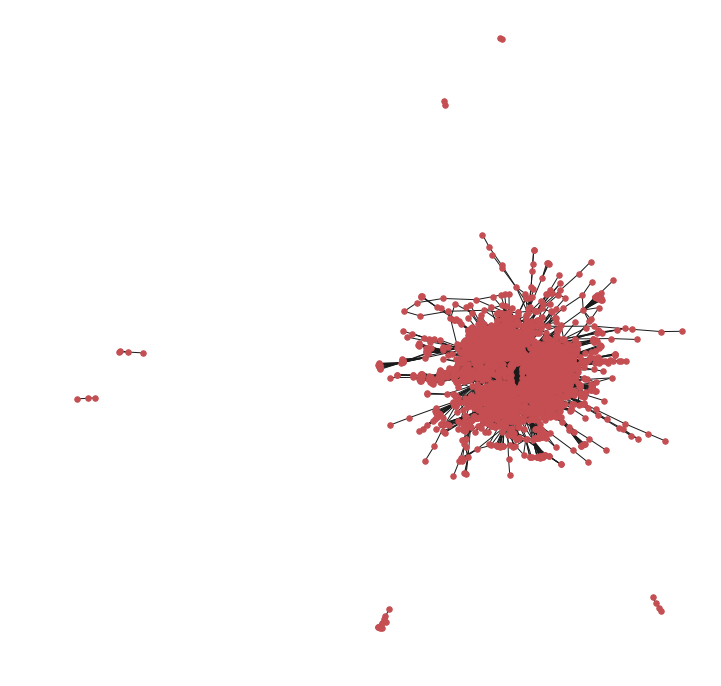

In [30]:
plt.figure(figsize=(12,12))
plt.axis("off")
nx.draw_spring(G, with_labels=False, node_size=30)

`Keep only the "Giant Component", taking out isolated airport with no connected routes.`

In [31]:
g = max(nx.connected_component_subgraphs(G), key=len)

`Inspecting one of the edges attributes`

In [32]:
g['SCL']['LIM']

{'airline': 'LA', 'equipment': '763 320 319', 'dist': 2462}

`Note that when we analyzed the dataset for this path (SCL-LIM), 6 possible links showed off, one for each air company that work on this route. When the graph was created, only one of the air carrier was automatically considered (The companies is sorted from "A" to "Z.`

### Analizing network

`For below analysis, the functions included at start of this notebook will be used.`

In [33]:
N, L, kmin, kmax, kmean, aveC, aveL, dmax, degrees, paths, clusters, dg_samples = large_network_analysis(
    g)

==> [Network General info] <==

Number of Nodes (N):  3154
Number of Links (L):  18593
Min Degree     kmin:  1
Max Degree     kmax:  246
Mean Degree     <k>:  12
Ave Short Path  <d>:  3.98
Diameter       dmax:  10
Ave Clustering  <C>:  0.48


`The graph nodes (3,154) are our airports and the links (18,593), the possible routes between 2 airports. The Links (or Edges) attributes are: airline, distance and aircraft used). The number of different routes (k) that is related to each airport (node), varies from 1 to 246, being 12 the global average number of routes per airport. The graph has a diameter of "8", what means that this is the maximum distance (in paths) between 2 airports in the network, taking the shortest possible path. The average short path on the network is around 4, what suggest that this network can be modeled using a "Small World" Model. Last but nor least, the average clustering coefficient is 0.49, what is very high!`   

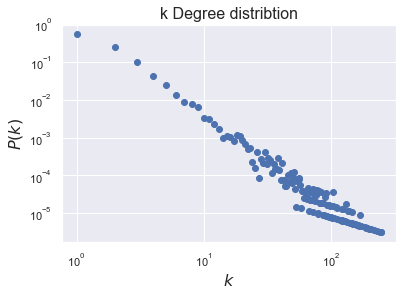

In [34]:
plot_k_distr(degrees)

`Plotting the degree distribution on a logarithm scale, we can see that some few HUBs (airport with high number of connections) appears. Also, seems that the pattern follows a "Power Law", for great part of distribution. As stated by Massimiliano Zanin on (6) "Modeling the Air Transport with Complex Networks: a short review", page 7, "One important aspect of flight networks is the fact that they show the scale-free feature. This implies the presence of few hubs with a very high number of connections, confirming the predominance of a hub-and-spoke topology".`

`Also, ALBERT-LÁSZLÓ BARABÁSI on (1) "NETWORK SCIENCE", Chapter 4, page 12, says: "(d) A scale-free network looks like the air-traffic network, whose nodes are airports and links are the direct flights between them. Most airports are tiny, with only a few flights. Yet, we have a few very large airports, like Chicago or Los Angeles, that act as major hubs, connecting many smaller airports. Once hubs are present, they change the way we navigate the network. For example, if we travel from Boston to Los Angeles by car, we must drive through many cities. On the airplane network, however, we can reach most destinations via a single hub, like Chicago."`

`Let's fit the distribution to the power law and see it on plot:`

Calculating best minimal value for power law fit


Degree Exponent: 1.86


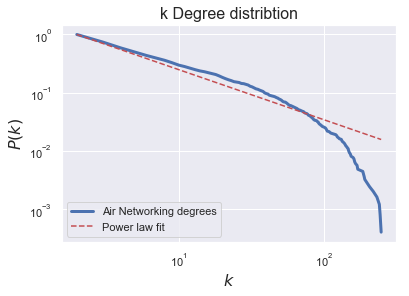

In [36]:
alpha = fit_power_law(degrees, 'Air Networking degrees', xmax=0)

`For k < 200 (great majority of degrees) we can verify that the distribution really follows a Power Law. This can suggest that our Air Network can be considered a "Scale-Free Small-World Network.`

kmean =  3.98


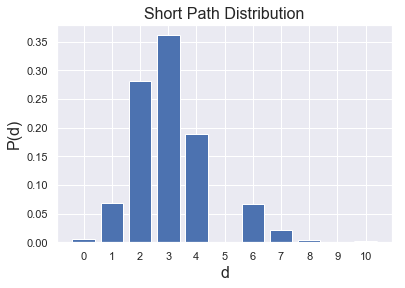

In [37]:
plot_path(paths)

`More than 1/3 of all routes has 3 or less legs, being 4 the average.` 

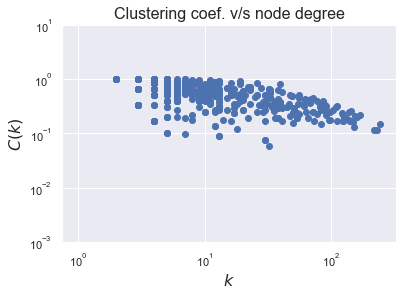

In [38]:
plot_cluster(clusters, dg_samples)

`The clustering coefficient C, is defined as the probability that two cities that are directly connected to a third city also are directly connected to each other. We find that C is typically larger for the air transportation network than for a random graph and that it decreases with K size, but slower than d, for example. These results are consistent with the expectations for a small-world network but not with those for a random graph. For the Air Worldwide Network, we find that <C> = 0.48. As also discussed by R. Guimera on (4) "The worldwide air transportation network: Anomalous centrality, community structure, and cities global roles", [age 2, "Therefore we conclude that the air transportation network is, as expected, a small-world network".`

### WorldWide Air Transportation Networking Models

`Watts-Strogatz graphs are intended to model networks in the natural and social sciences. In their original paper, Watts and Strogatz looked at the network of film actors (connected if they have appeared in a movie together); the electrical power grid in the western United States; and the network of neurons in the brain of the roundworm C. elegans. They found that all of these networks had the high connectivity (C) and low path lengths (d), that are  characteristics of "Small World" graphs, same as we found above.`

`So, let's create a WS model, with n=3,154 (number of airports) and k=12 (our average number of connections <k>)`

In [35]:
ws = nx.watts_strogatz_graph(n=3154, k=12, p=0.12)

In [36]:
N_ws, L_ws, kmin_ws, kmax_ws, kmean_ws, aveC_ws, aveL_ws, dmax_ws, degrees_ws, paths_ws, clusters_ws, dg_samples_ws = large_network_analysis(
    ws)

==> [Network General info] <==

Number of Nodes (N):  3154
Number of Links (L):  18924
Min Degree     kmin:  8
Max Degree     kmax:  17
Mean Degree     <k>:  12
Ave Short Path  <d>:  4.58
Diameter       dmax:  7
Ave Clustering  <C>:  0.46


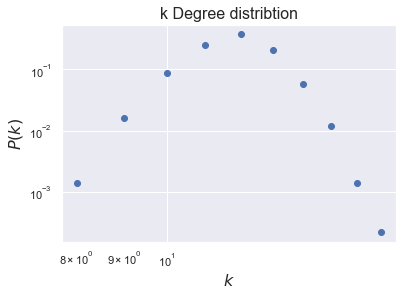

In [37]:
plot_k_distr(degrees_ws)

kmean =  4.58


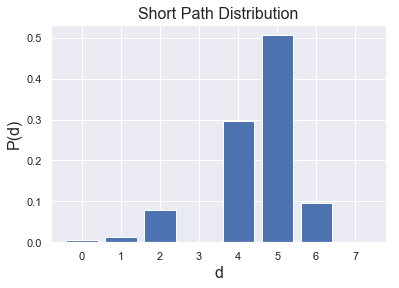

In [38]:
plot_path(paths_ws)

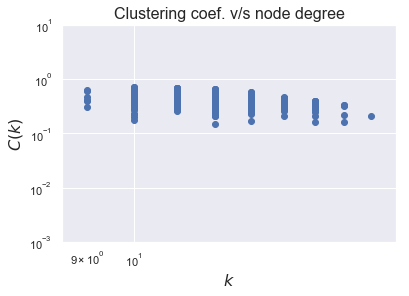

In [39]:
plot_cluster(clusters_ws, dg_samples_ws)

`The WS model confirm the suggestion that Air Network is a Small word, because show low <d> and high <C>, with values similar to what we found with real data. In fact on our real data <d> = 3.92, what is even smaller than <d> = 4.6 on WS model. On the other side, failed on show that k distribution follows a power law.`

`In 1999 Barabási and Albert published a paper, “Emergence of Scaling in Random Networks”, that characterizes the structure of several real-world networks, including graphs that represent the interconnectivity of movie actors, web pages, and elements in the electrical power grid in the western United States. They measure the degree of each node and compute its distribution, the probability that a node has degree k. Then they plot P(k) versus k on a log-log scale (same as we did above). The plots fit a straight line, at least for large values of k, so Barabási and Albert conclude that these distributions are heavy-tailed and obeys a power law. Graphs with this property are sometimes called scale-free networks. `

`So, let's create a BA model, with n=3,154 (number of airports) and m=6 (I started with 12, our average number of conections <k> and reduced it until Mean degree became same as the Air Network)`

In [40]:
ba = nx.barabasi_albert_graph(n=3154, m=6, seed=None)

In [41]:
N_ba, L_ba, kmin_ba, kmax_ba, kmean_ba, aveC_ba, aveL_ba, dmax_ba, degrees_ba, paths_ba, clusters_ba, dg_samples_ba = large_network_analysis(
    ba)

==> [Network General info] <==

Number of Nodes (N):  3154
Number of Links (L):  18888
Min Degree     kmin:  6
Max Degree     kmax:  244
Mean Degree     <k>:  12
Ave Short Path  <d>:  3.19
Diameter       dmax:  5
Ave Clustering  <C>:  0.02


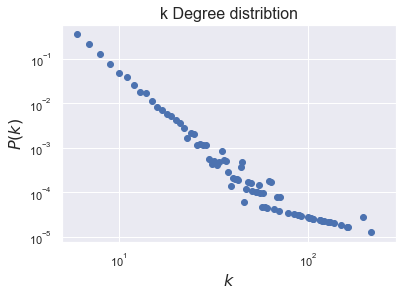

In [42]:
plot_k_distr(degrees_ba)

Degree Exponent: 2.99


2.99

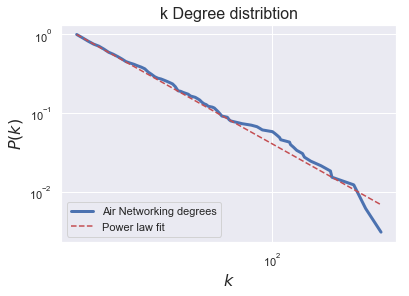

In [43]:
fit_power_law(degrees_ba, 'Air Networking degrees', xmax=20)

kmean =  3.19


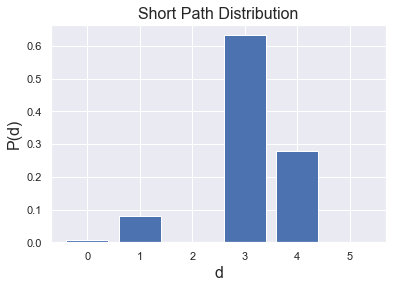

In [44]:
plot_path(paths_ba)

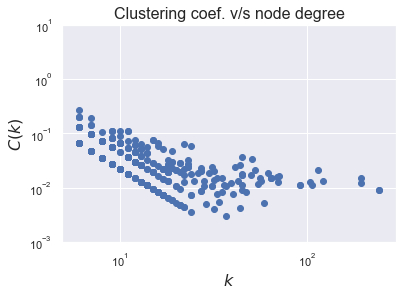

In [45]:
plot_cluster(clusters_ba, dg_samples_ba)

`So the BA model is better than the WS model at reproducing the degree distribution. Also the average path length, L, is 3.13, which is even more “small world” than the actual network, which has L = 3.92. On the other hand, the clustering coefficient, C, is 0.02, not even close to the value in the dataset, 0.48. Concluding, The WS model captures the small world characteristics, but not the degree distribution. The BA model captures the degree distribution and the average path length, but not the clustering coefficient.`

`On (2) "Think Complexity", chapter 3 and 4, Allen B. Downey performed same analysis with a different dataset, a set of Facebook users and their friends from the Stanford Network Analysis Project (SNAP). The result found by Downey is very close with what we found on the WorldWide Air Transportation Networking and suggests that this network is a "Free-Scale Small World Network.` 

### Ultra Small World 
Ln (Ln N) = Ln(8.1) = 2.1 ==> 2 < alpha < 3

In [46]:
print ("alpha =", round(alpha,1))
print ("[Eq. 4.22]:")
print ("           <d> ~ LnLnN     =", round(np.log(np.log(N)),1))
print ("           <d> ~ lnN/LnLnN =", round(np.log(N)/(np.log(np.log(N))),1))
print ("           <d> ~ LnN       =", round(np.log(N),1))

alpha = 2.2
[Eq. 4.22]:
           <d> ~ LnLnN     = 2.1
           <d> ~ lnN/LnLnN = 3.9
           <d> ~ LnN       = 8.1


`According ALBERT-LÁSZLÓ BARABÁSI on (1) "NETWORK SCIENCE", Chapter 4, page 21, the presence of hubs in scale-free networks affect the small world property. "Airlines build hubs precisely to decrease the number of hops (stops) between two airports. The calculations support this expectation, finding that distances in a scale-free network are smaller than the distances observed in an equivalent random network."`

`Also on (1), "Equation (4.22) predicts that in this regime the average distance increases as lnlnN, a significantly slower growth than the lnN derived for random networks. We call networks in this regime ultra-small, as the hubs radically reduce the path length. They do so by linking to a large number of small-degree nodes, creating short distances between them."`

### Graphing the Network

In [39]:
deg = nx.degree(g)
node_size_degree = [5 * deg[iata] for iata in g.nodes]

In [40]:
labels = {iata: iata if deg[iata] >= 20 else ''
          for iata in g.nodes}

In [41]:
altitude = airports_rg['alt']
altitude = [altitude[iata] for iata in g.nodes]

In [42]:
country = airports_rg['country']
country = [country[iata] for iata in g.nodes]

`Top 15 airports regarding its degree of connections:`

In [43]:
airp_deg = dict(deg)
sorted(airp_deg.items(),  key=lambda x: x[1], reverse=True)[:15]

[('AMS', 246),
 ('FRA', 242),
 ('CDG', 239),
 ('IST', 230),
 ('ATL', 217),
 ('ORD', 205),
 ('PEK', 197),
 ('MUC', 190),
 ('DFW', 188),
 ('DME', 186),
 ('DXB', 184),
 ('LHR', 170),
 ('DEN', 168),
 ('IAH', 168),
 ('LGW', 164)]

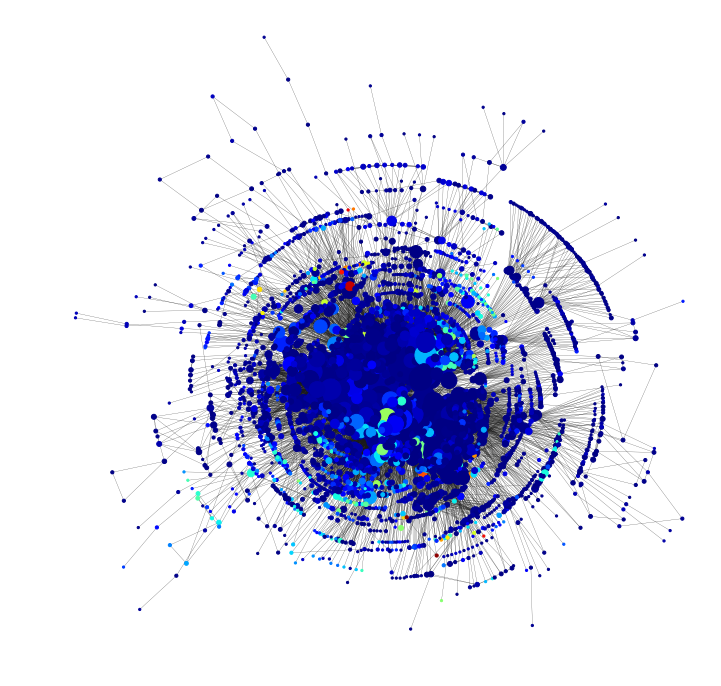

In [52]:
plt.figure(figsize=(12, 12))
plt.axis("off")
nx.draw_kamada_kawai(
    g,
    font_size=10,
    alpha=1,
    width=.2,
    node_size=node_size_degree,
    labels=labels,
    with_labels=False,
    node_color=altitude,
    cmap=plt.get_cmap("jet"))

### Plotting the network on a geo map

`Will be much easer to analyze the Air transportation network, plotting it on a geography map:`

In [44]:
lat_min = round(airports_rg.lat.min(), 2)
lat_max = round(airports_rg.lat.max(), 2)
lon_min = round(airports_rg.lon.min(), 2)
lon_max = round(airports_rg.lon.max(), 2)
print("Latitude Range:  {}, {}".format(lat_min, lat_max))
print("Longitude Range: {}, {}".format(lon_min, lon_max))

Latitude Range:  -90.0, 82.52
Longitude Range: -179.88, 179.95


In [45]:
def plot_net_map(G,
                 labels=labels,
                 pos=pos,
                 title=None,
                 node_color='b',
                 edge_color='k',
                 map_range=[180, -180, 90, -90],
                 node_size=25,
                 figsize=(20, 20),
                 width=.15,
                 with_labels=True,
                 cmap=plt.cm.autumn):
    crs = ccrs.PlateCarree()
    fig, ax = plt.subplots(
        1, 1, figsize=figsize, subplot_kw=dict(projection=crs))
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title(title, fontsize=16)
    ax.set_extent(map_range)
    nx.draw_networkx(
        G,
        ax=ax,
        font_size=10,
        alpha=.4,
        width=width,
        node_size=node_size,
        with_labels=with_labels,
        labels=labels,
        pos=pos,
        node_color=node_color,
        edge_color=edge_color,
        cmap=cmap)

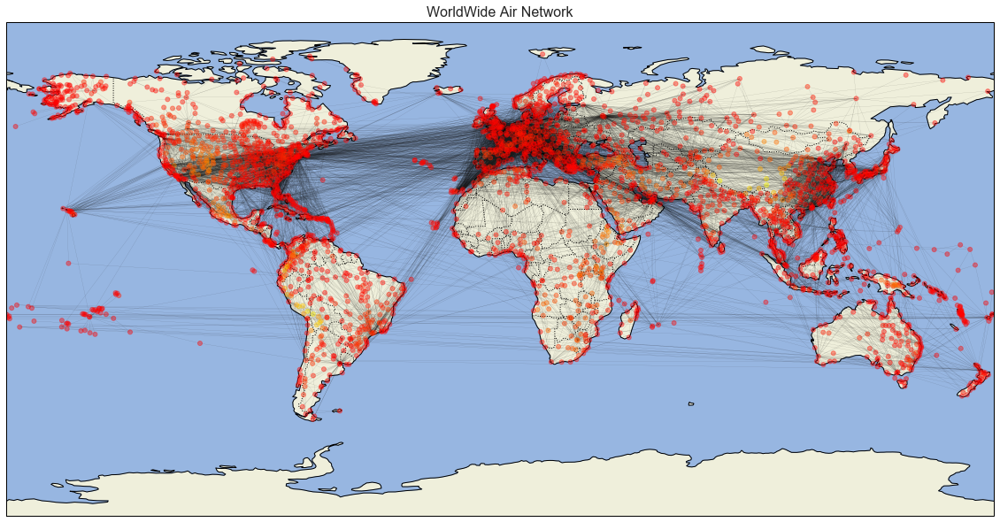

In [49]:
plot_net_map(g, title="WorldWide Air Network", with_labels=False, node_color=altitude)

`Zoom in Brazil`

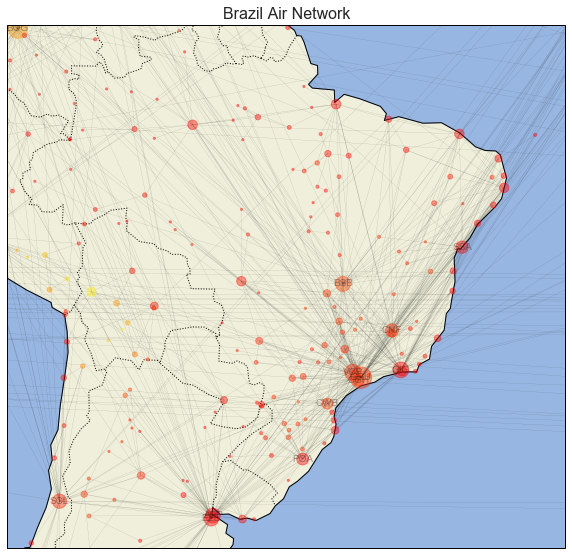

In [50]:
br = [-30, -75, 5, -35]
plot_net_map(g, title="Brazil Air Network", map_range = br, figsize = (10, 10), node_color=altitude, node_size=node_size_degree)

`Zoom in Chile`

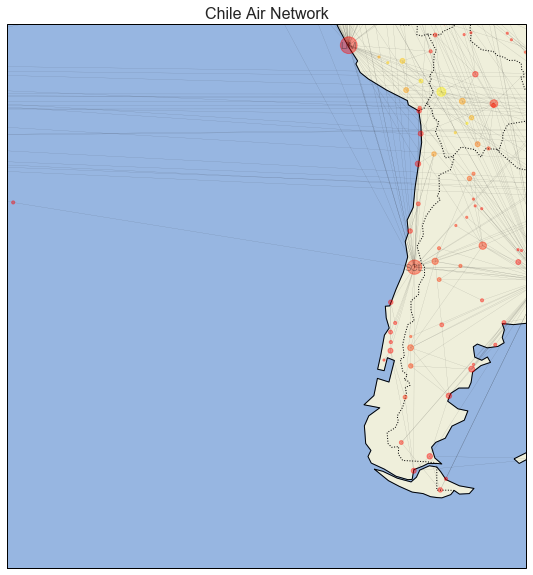

In [51]:
cl = [-60, -110, -10, -60]
plot_net_map(g, title="Chile Air Network", map_range = cl, figsize = (10, 10), node_color=altitude, node_size=node_size_degree)

`Zoom LATAM`

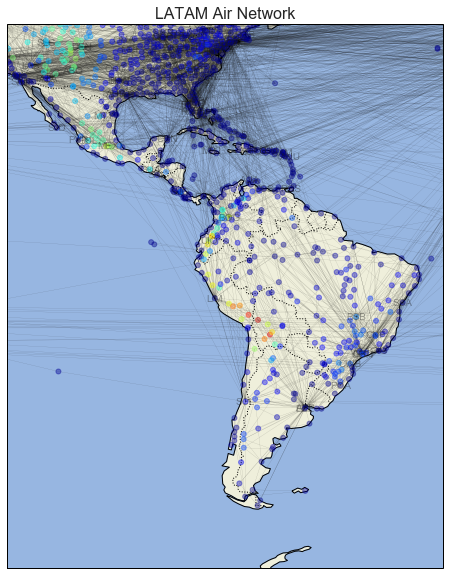

In [52]:
latam = [-30, -120, 35, -60]
plot_net_map(g, title="LATAM Air Network", map_range=latam, node_color=altitude, figsize = (10, 10), cmap=plt.get_cmap("jet") )

### EGO Networks

`Ego-centric methods really focus on the individual, rather than on network as a whole. By collecting information on the connections among the modes connected to a focal ego, we can build a picture of the local networks of the individual, in our case a specific airport`

In [53]:
def graph_ego_net(node, title=None, node_size=600, with_labels=True):
    ego = node
    nodes = set([ego])
    nodes.update(g.neighbors(ego))
    egonet = g.subgraph(nodes)
    plt.figure(figsize=(8, 8))
    plt.title(node + " - Ego Network", fontsize=16)
    plt.axis("off")
    nx.draw_kamada_kawai(
        egonet,
        node_color='y',
        node_size=node_size,
        with_labels=with_labels,
        alpha=1,
        width=.2,
    )

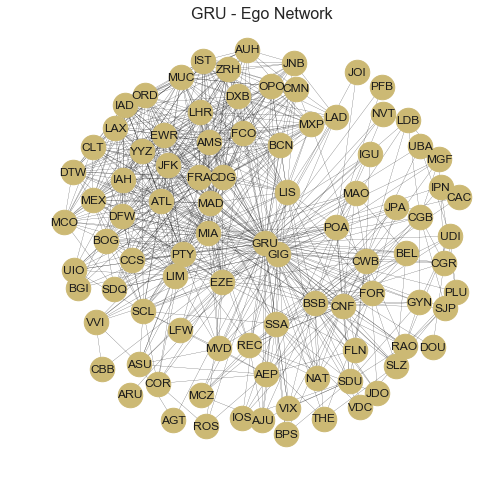

In [54]:
graph_ego_net('GRU')

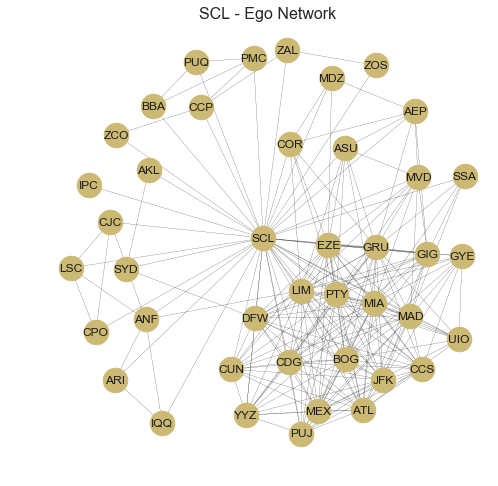

In [55]:
graph_ego_net('SCL')

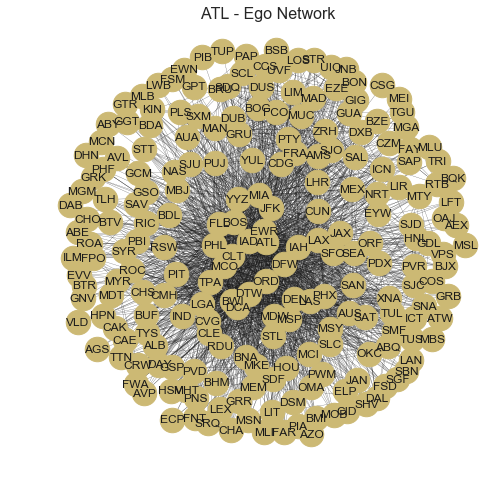

In [56]:
graph_ego_net('ATL')

`Plotting on a geo map`

In [57]:
def plot_ego_net_map(node,
                     pos=pos,
                     node_color='r',
                     map_range=[180, -180, 90, -90],
                     node_size=40,
                     edge_color='k',
                     figsize=(15, 15),
                     width=.15,
                     with_labels=True,
                     cmap=plt.cm.autumn):
    ego = node
    nodes = set([ego])
    nodes.update(g.neighbors(ego))
    egonet = g.subgraph(nodes)
    crs = ccrs.PlateCarree()
    fig, ax = plt.subplots(
        1, 1, figsize=figsize, subplot_kw=dict(projection=ccrs.PlateCarree()))
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title(node+" - Ego Network", fontsize=16)
    ax.set_extent(map_range)
    nx.draw_networkx(
        egonet,
        ax=ax,
        font_size=10,
        alpha=.75,
        width=width,
        node_size=node_size,
        with_labels=with_labels,
        pos=pos,
        node_color=node_color,
        edge_color=edge_color,
        cmap=cmap)

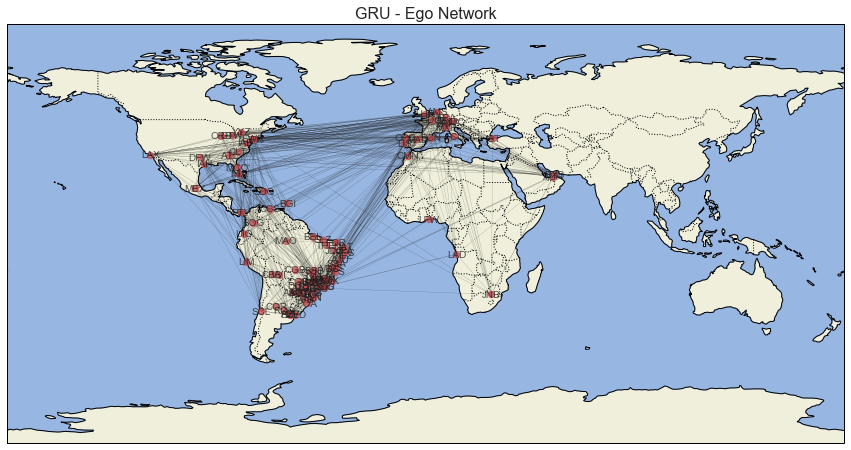

In [58]:
plot_ego_net_map("GRU")

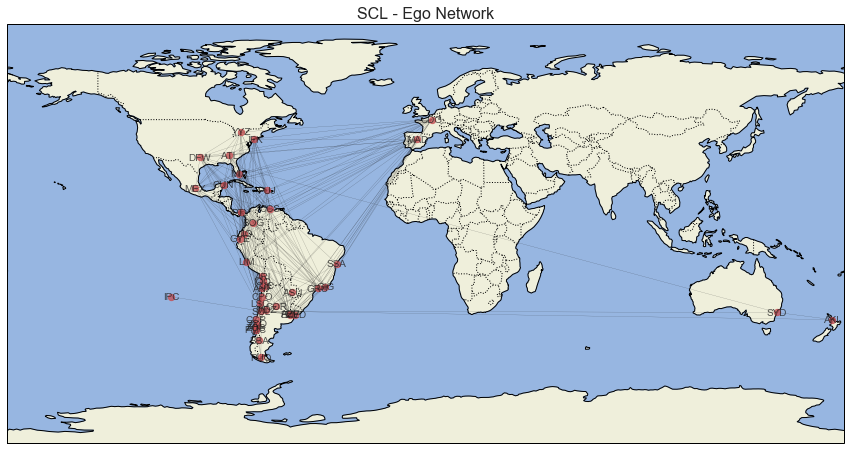

In [59]:
plot_ego_net_map("SCL")

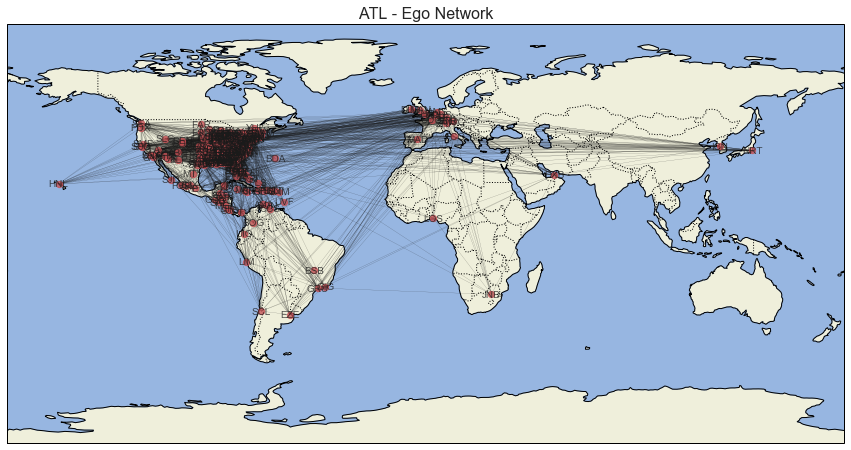

In [60]:
plot_ego_net_map("ATL")

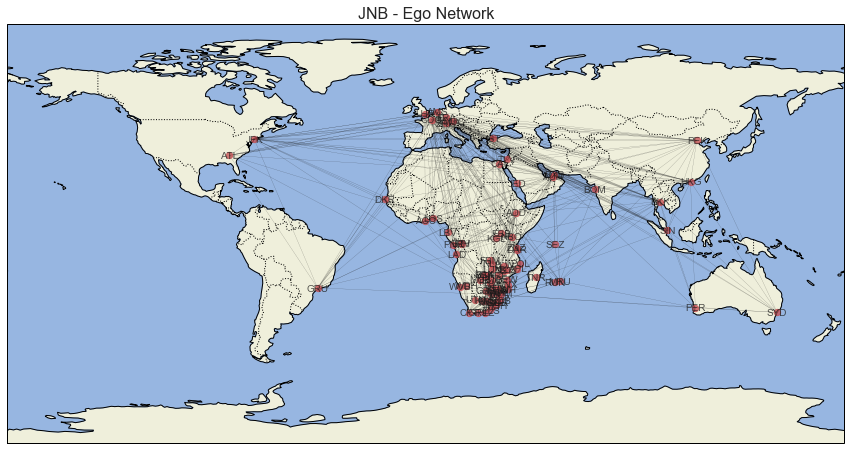

In [61]:
plot_ego_net_map("JNB")

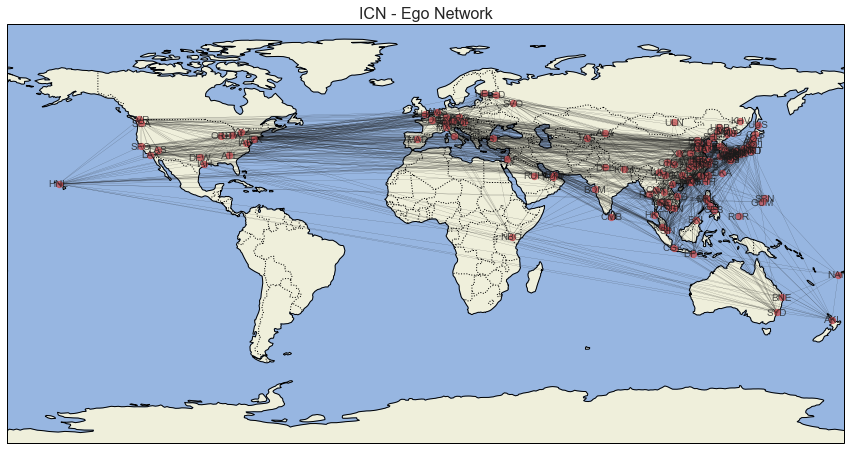

In [62]:
plot_ego_net_map("ICN")

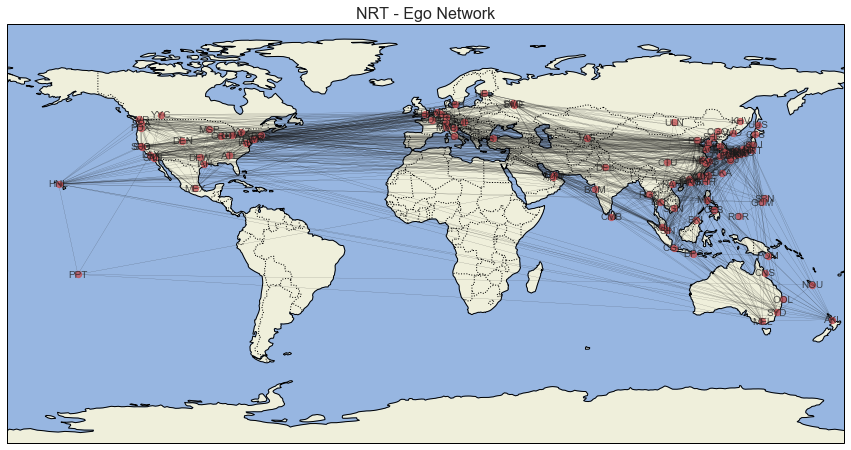

In [63]:
plot_ego_net_map("NRT")

### Centrality 

In [64]:
degCent = nx.betweenness_centrality(g)
betCent = nx.betweenness_centrality(g)
cloCent = nx.closeness_centrality(g)
eigCent = nx.eigenvector_centrality(g)

`Top 15 airports regarding its centrality:`

In [65]:
top_k = pd.DataFrame(sorted(airp_deg.items(),  key=lambda x: x[1], reverse=True)[:15])
top_deg = pd.DataFrame(sorted(degCent.items(),  key=lambda x: x[1], reverse=True)[:15])
top_bet = pd.DataFrame(sorted(betCent.items(),  key=lambda x: x[1], reverse=True)[:15])
top_clo = pd.DataFrame(sorted(cloCent.items(),  key=lambda x: x[1], reverse=True)[:15])
top_eig = pd.DataFrame(sorted(eigCent.items(),  key=lambda x: x[1], reverse=True)[:15])

In [66]:
df_cent = pd.concat([top_k, top_deg], axis=1)
df_cent = pd.concat([df_cent, top_bet], axis=1)
df_cent = pd.concat([df_cent, top_clo], axis=1)
df_cent = pd.concat([df_cent, top_eig], axis=1)
del df_cent[1]
df_cent.columns = ['Net_k', 'Degree', 'Betweenness', 'Closeness', 'Eigenvector' ]
df_cent

,Net_k,Degree,Betweenness,Closeness,Eigenvector
0,AMS,CDG,CDG,FRA,AMS
1,FRA,LAX,LAX,CDG,FRA
2,CDG,DXB,DXB,LHR,CDG
3,IST,ANC,ANC,AMS,MUC
4,ATL,FRA,FRA,DXB,FCO
5,ORD,AMS,AMS,LAX,LHR
6,PEK,PEK,PEK,JFK,BCN
7,MUC,ORD,ORD,YYZ,IST
8,DFW,YYZ,YYZ,IST,ZRH
9,DME,IST,IST,MUC,MAD


`We can see that the criteria used to calculated the "most centralized airports", have high influence in the order and also the results are not in the same order that the ones with bigger "k" ("Net_k"). Note that existing cases where some airports are very "centralized", but low connected. This can be considered an anomalies, as explained by R. Guimera on (4) "The worldwide air transportation network: Anomalous centrality, community structure, and cities global roles".`

`Comparing the top node on each criteria:`

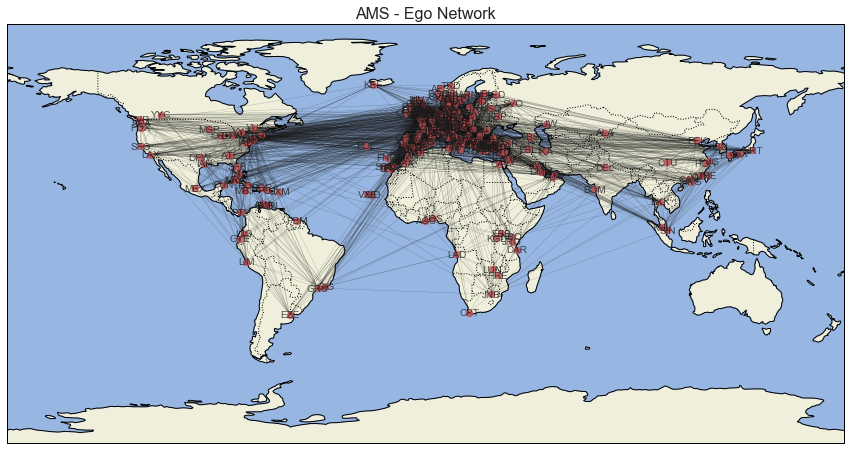

In [67]:
plot_ego_net_map("AMS")

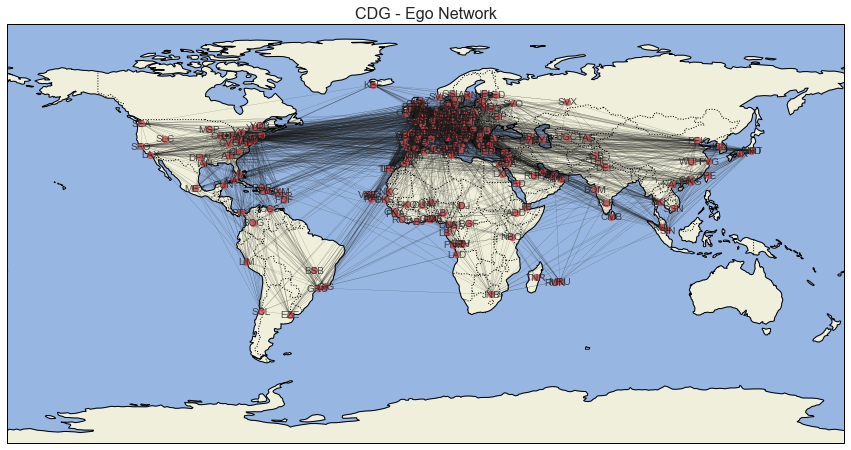

In [68]:
plot_ego_net_map("CDG")

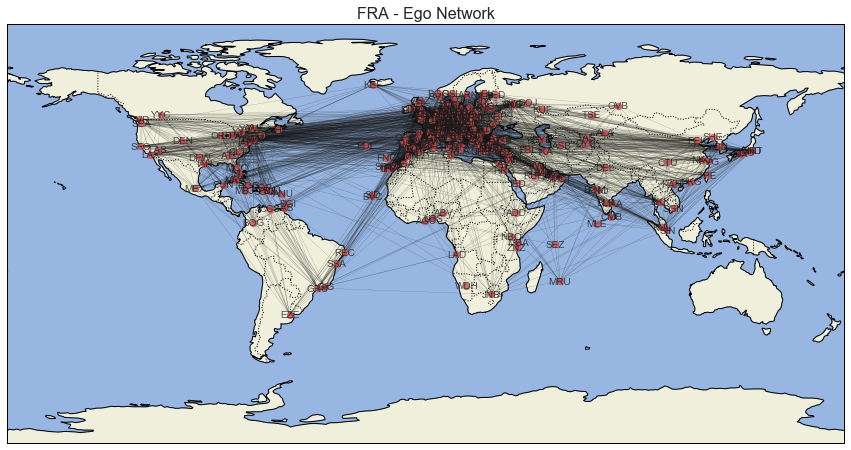

In [69]:
plot_ego_net_map("FRA")

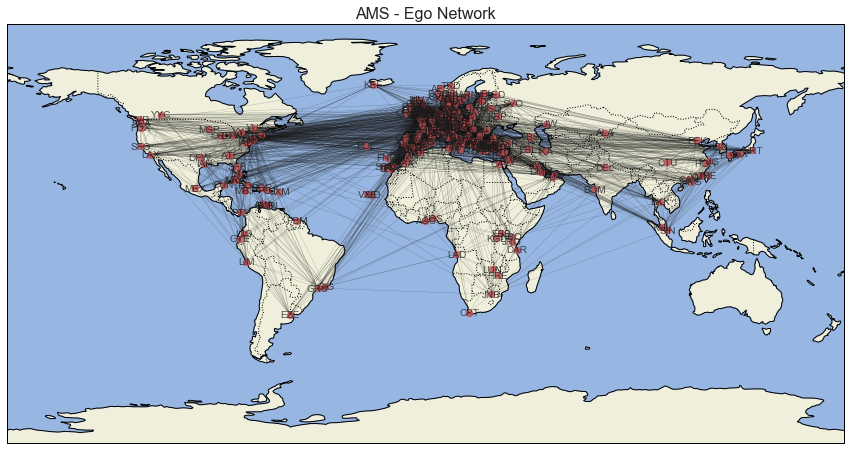

In [70]:
plot_ego_net_map("AMS")

`Plotting Centrality on a geo`

In [71]:
# node_degree_color = [20000.0 * g.degree(v) for v in g]
node_degCent_size = [v * 10000 for v in betCent.values()]
node_betCent_size = [v * 10000 for v in betCent.values()]
node_cloCent_size = [v * 100 for v in cloCent.values()]
node_eigCent_size = [v * 2000 for v in eigCent.values()]

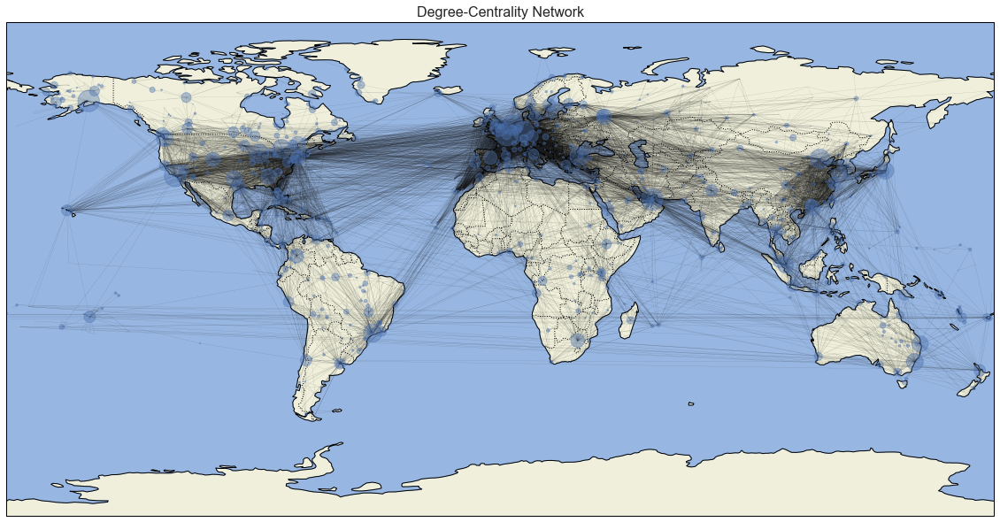

In [72]:
plot_net_map(g, title="Degree-Centrality Network", node_size=node_degCent_size, with_labels=False)

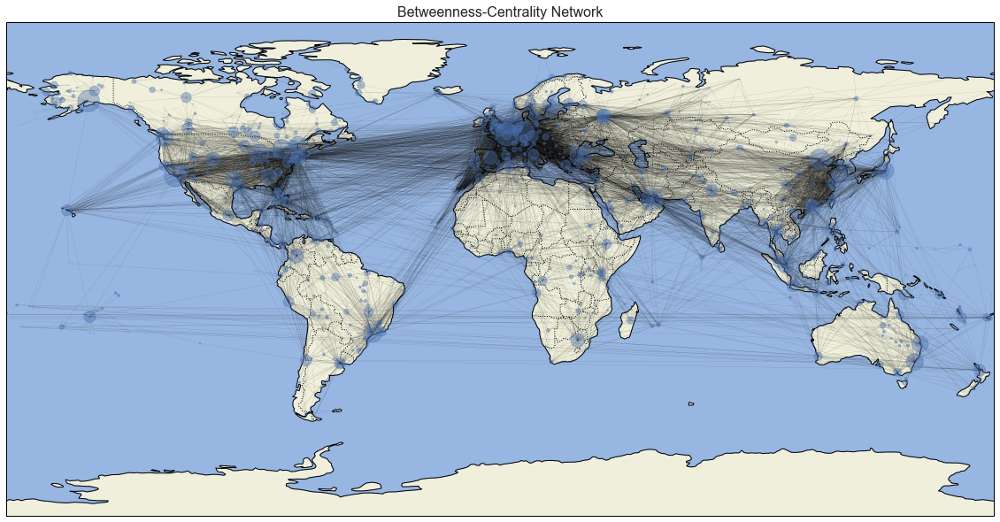

In [73]:
plot_net_map(g, title="Betweenness-Centrality Network", node_size=node_betCent_size, node_color='b', with_labels=False)

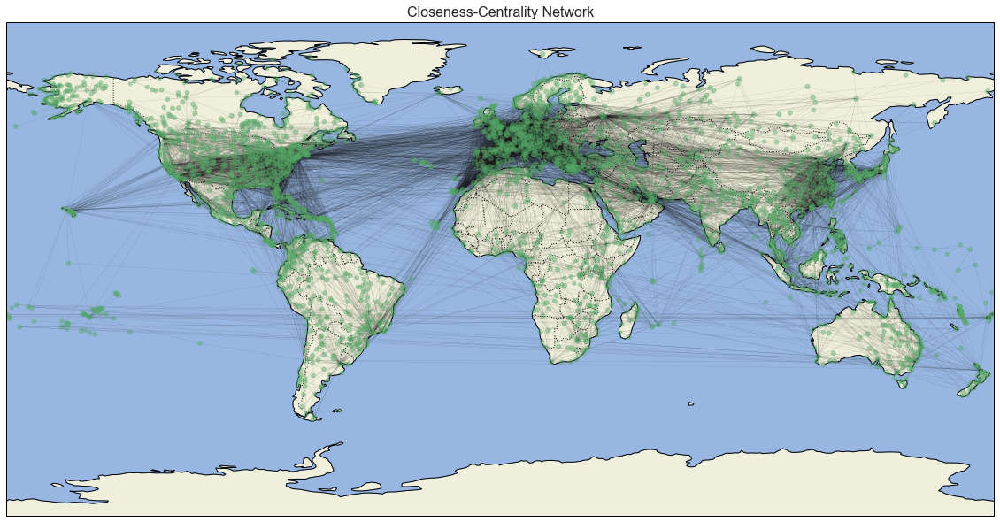

In [74]:
plot_net_map(g, title="Closeness-Centrality Network", node_size=node_cloCent_size, node_color='g', with_labels=False)

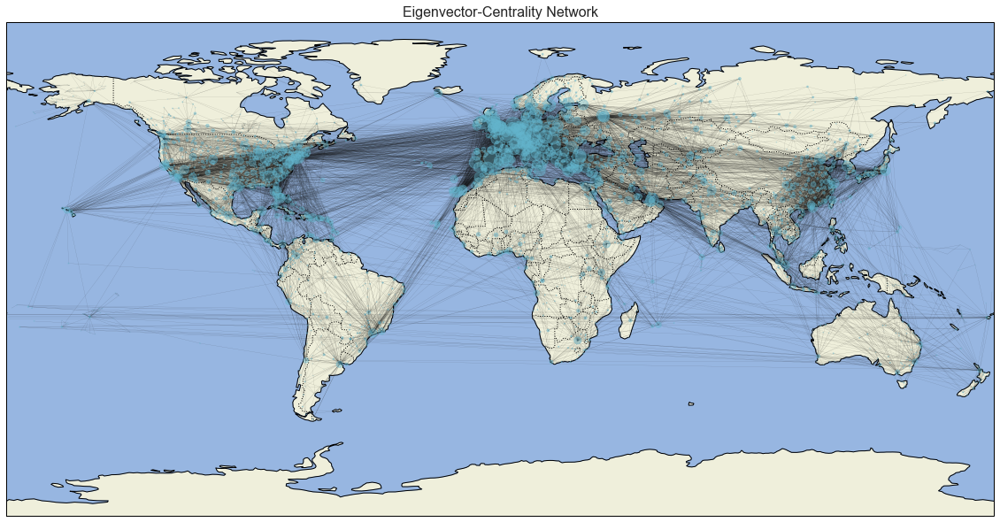

In [75]:
plot_net_map(g, title="Eigenvector-Centrality Network", node_size=node_eigCent_size, node_color='c', with_labels=False)

`Plotting the network on a geo Map, having the node size proportional to centrality, we can "on a general view", realize that "Degree" and "Betweenness" are similar and that "Closeness" seems no add a relevant information. By that other side, "Eigenvector" method seems interesting and capture importnat hubs as Santiago (SCL) for example that did not appear on other methods.`

`Focusing on "Betweenness", the relevant question is, however, "what general and plausible mechanism would give rise to scale-free networks with the obtained anomalous distribution of betweenness centralities?"`

`To answer this question, it is useful to consider a region such as Alaska. Alaska is a sparsely populated, isolated region with a disproportionately large, for its population size, number of airports. Most Alaskan airports have connections only to other Alaskan airports. This fact makes sense geographically. However, distance-wise, it also would make sense for some Alaskan airports to be connected to airports in Canada’s Northern Territories. These connections are, however, absent. Instead, a few Alaskan airports, singularly Anchorage, are connected to the continental U.S. The reason is clear: the Alaskan population needs to be connected to the political centers, which are located in the continental U.S., whereas there are political constraints making it difficult to have connections to cities in Canada, even to ones that are close geographically. It is now obvious why Anchorage’s centrality is so large. Indeed, the existence of nodes with anomalous centrality is related to the existence of regions with a high density of airports but few connections to the outside. The degree-betweenness anomaly is therefore ultimately related to the existence of communities in the network(4). This can be verified on the map where Alaska's region is detailed:`

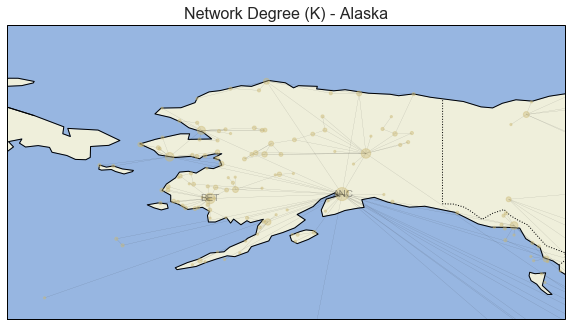

In [76]:
plot_net_map(
    g,
    title = "Network Degree (K) - Alaska",
    map_range=[-180, -130, 75, 50],
    node_color='y',
    node_size=node_size_degree,
    figsize = (10, 10),
    with_labels=True)

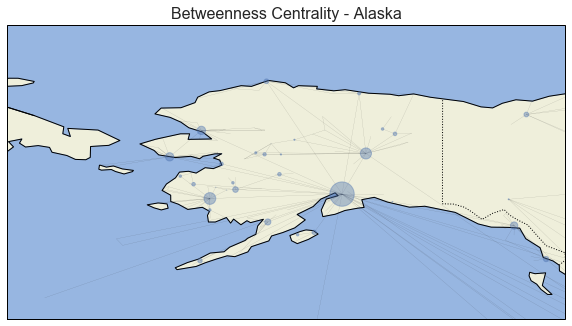

In [77]:
plot_net_map(
    g,
    title = "Betweenness Centrality - Alaska",
    map_range=[-180, -130, 75, 50],
    node_color='b',
    node_size=node_betCent_size,
    figsize = (10, 10),
    with_labels=False)

`Also, according (5), the World Airline Network (WAN) is an infrastructure that reduces the geographical gap between societies, both small and large, and brings forth economic gains. With the extensive use of a publicly maintained data set that contains information about airports and alternative connections between these airports, we empirically reveal that the WAN is a redundant and resilient network for long distance air travel, but otherwise breaks down completely due to removal of short and apparently insignificant connections. These short range connections with moderate number of passengers and alternate flights are the connections that keep remote parts of the world accessible, as the Alaska case described before. It is surprising, insofar as there exists a highly resilient and strongly connected core consisting of a small fraction of airports (around 2.3%) together with an extremely fragile star-like periphery.` 

### Community Detection

In [78]:
from cytoolz import keyfilter, valmap, valfilter, frequencies

In [79]:
com_parts = community.best_partition(g, random_state=747)
com_values = [com_parts.get(node) for node in g.nodes()] # Community id number for each individual node

In [80]:
print("Comunities: ", set(com_parts.values()))

Comunities:  {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17}


In [81]:
community_sizes = frequencies(com_parts.values())
community_sizes

{0: 157,
 1: 271,
 2: 491,
 3: 501,
 4: 130,
 5: 468,
 6: 672,
 7: 106,
 8: 238,
 9: 7,
 10: 10,
 11: 3,
 12: 28,
 13: 7,
 14: 9,
 15: 12,
 16: 21,
 17: 23}

`17 Communities were found. Let's dig on them:`

`Here we can see that all airports on Community #3 (the smallest one) are geographic connected on Israel.`

In [82]:
for k,v in com_parts.items():
    if v == 11:
        print(k)

ETH
SDV
HFA


`We can check that North America airports are on a community (#6) and South America on another (#1):` 

In [83]:
print ("Mexico: {} and NYC: {}".format(com_parts.get("MEX"), com_parts.get("JFK")))

Mexico: 6 and NYC: 6


In [84]:
print ("Santiago: {} and Sao Paulo: {}".format(com_parts.get("SCL"), com_parts.get("GRU")))

Santiago: 1 and Sao Paulo: 1


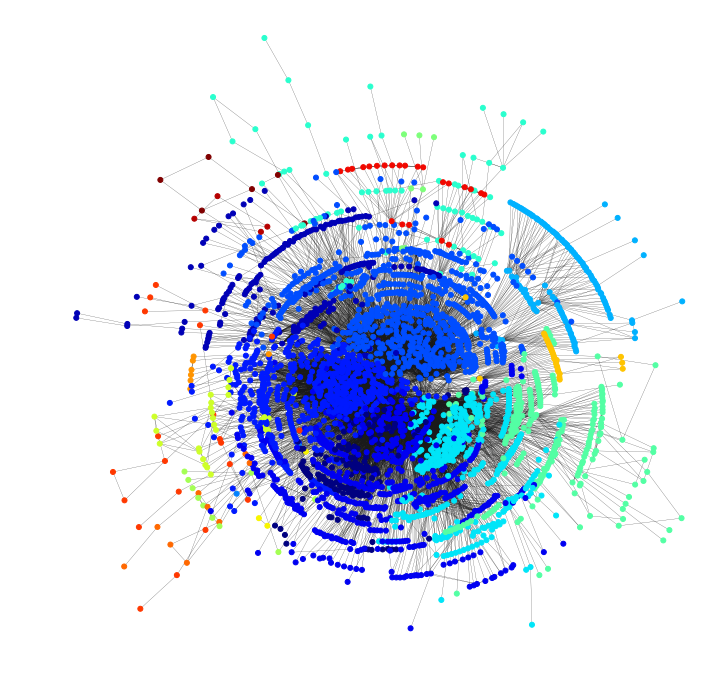

In [89]:
fig = plt.figure(figsize=(12, 12))
plt.axis("off")
nx.draw_kamada_kawai(
    g,
    font_size=10,
    alpha=1,
    width=.2,
    node_size=25,
    labels=labels,
    with_labels=False,
    node_color=com_values,
    cmap=plt.get_cmap("jet"))

`Defining Communities colors`

In [85]:
from matplotlib.colors import rgb2hex
palette = sns.color_palette('colorblind', n_colors=len(com_parts))
palette = list(map(rgb2hex, palette))

In [86]:
node_colors = valmap(lambda x: palette[x], com_parts)
node_color_community = [node_colors[n] for n in g.nodes()]

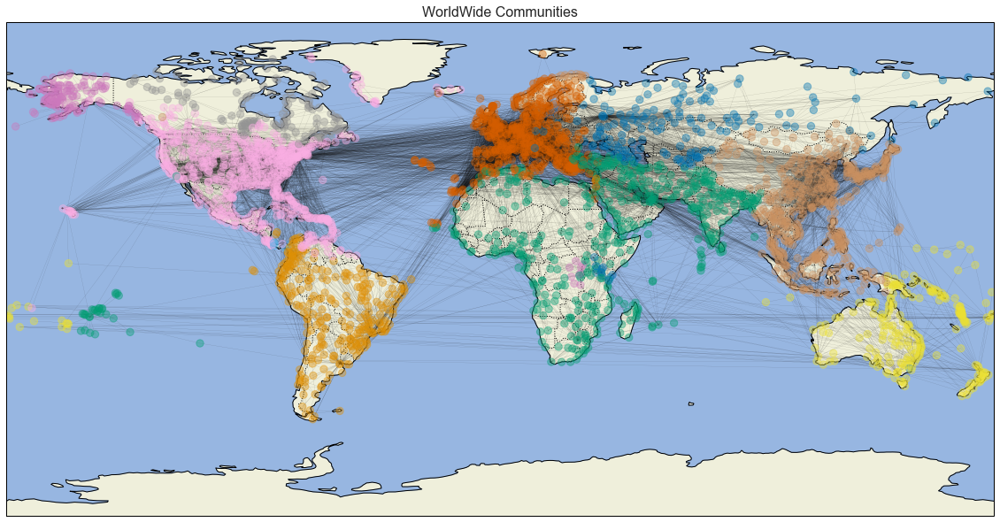

In [87]:
plot_net_map(
    g,
    title = "WorldWide Communities",
    node_color=node_color_community,
    node_size=70,
    with_labels=False)

`On above map is possible to confirm that the airports are connected in "communities" with some geographic correlation, but not only this.`

`On a more detailed map below, were now, the size of nodes are related with centrality, Alaska, Aleutian Islands, French Polynesia, American Samoa, etc, form separate communities. This fact explains the large betweenness centrality of some remote airports, because there are some of them as Anchorage (Alaska), Papete (FP), that provide the main links to the outside world for the other cities in their communities.`

`Another significant result is that even though geographical distance plays a clear role in the definition of the communities, the composition of some of the communities cannot be explained by purely geographical considerations. For example, the community that contains most cities in Europe also contains most airports in Asian Russia. Similarly, Japanese cities are mostly grouped with cities in the other countries in Oceania, but India is mostly grouped with the Arabic Peninsula countries and with countries in Northeastern Africa. These facts are consistent with the important role of political factors in determining community structure (4). Please also see the Latin America case (Cuba & Venezuela) on Part C of this project.`

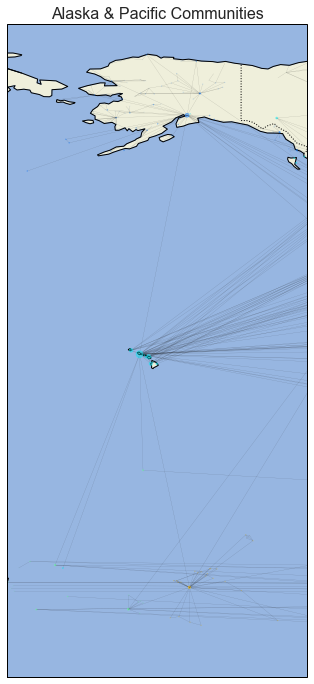

In [88]:
plot_net_map(
    g,
    title = "Alaska & Pacific Communities",
    node_color=com_values,
    node_size=node_eigCent_size,
    with_labels=False,
    map_range=[-180, -130, 75, -30],
    figsize = (12, 12),
    cmap=plt.get_cmap("jet"))

### Conclusion on air Networking Analysis

`On this project, the main idea so far, was to analyze the structure of the world-wide air transportation network. The study enables us to unveil a number of significant results. The worldwide air transportation network is a "Small-World" network (*) in which (i) the number of nonstop connections from a given city and (ii) the number of shortest paths going through a given city have distributions that are scale-free. Surprisingly, the nodes with more connections are not always the most central in the network. We hypothesize that the origin of such a behavior is the multicommunity structure of the network (4). We find the communities in the network and demonstrate that their structure can only be understood in terms of both geographical and political considerations (4).`

`(*) According BARABÁSI, the presence of hubs in scale-free networks affect the small world property. "Airlines build hubs precisely to decrease the number of hops (stops) between two airports". Barabasi calls networks in this regime "Ultra-Small, as the hubs radically reduce the path length.`

---

`Our analysis of the community structure of the air transportation network is important for two additional reasons. First, it allows us to identify the most efficient ways to engineer the structure of the network. Specifically, having identified the communities, one can identify which ones are poorly connected and the ways to minimize that problem. Second, cities that connect different communities play a disproportionate role in important dynamic processes such as the propagation of infections such as severe acute respiratory syndrome. As we described, finding the communities is the first step toward identifying these cities (4).`

## Part B. Calculating the best route: Dijkstra's algorithm

<p><img src="./images/i_will_find_you.png" width="500" ></p>

[More info: Finding The Shortest Path, With A Little Help From Dijkstra](https://medium.com/basecs/finding-the-shortest-path-with-a-little-help-from-dijkstra-613149fbdc8e)

`Creating a function to calculate the best short path:`

In [89]:
def plot_short_route(G, 
                     source, 
                     target, 
                     weight='dist',
                     pos=pos,
                     node_color='g',
                     width=2,
                     map_range=[180, -180, 90, -90],
                     node_size=500,
                     figsize=(12, 12),
                     with_labels=True):
    
    shortpath = nx.dijkstra_path(G, source, target, weight)
    print("\n   Shortest path: ", shortpath)
    print("\n")

    G1 = nx.Graph()
    G1.add_nodes_from(shortpath)
    ls = len(shortpath)
    for i in range(0, ls - 1):
        G1.add_edge(shortpath[i], shortpath[i + 1])
        print(
            ("   Track {}: [{}-{}] \tDistance: {} Km \tArline: {} / Plane: {}".
             format(i + 1, shortpath[i], shortpath[i + 1],
                    g[shortpath[i]][shortpath[i + 1]]['dist'],
                    g[shortpath[i]][shortpath[i + 1]]['airline'],
                    g[shortpath[i]][shortpath[i + 1]]['equipment'])))
        
    crs = ccrs.PlateCarree()
    fig, ax = plt.subplots(
        1, 1, figsize=figsize, subplot_kw=dict(projection=ccrs.PlateCarree()))
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title("Shortest path between "+source+" and "+target, fontsize=16)
    ax.set_extent(map_range)
    nx.draw_networkx(
        G1,
        ax=ax,
        font_size=10,
        alpha=.75,
        width=width,
        node_size=node_size,
        with_labels=with_labels,
        pos=pos,
        node_color=node_color,
        edge_color = "r")

`Let's calculate the short path from Santiago, Chile to Manaus, Brazil but not using distance as a weight`


   Shortest path:  ['SCL', 'GRU', 'MAO']


   Track 1: [SCL-GRU] 	Distance: 2614 Km 	Arline: LA / Plane: 763 320 319
   Track 2: [GRU-MAO] 	Distance: 2697 Km 	Arline: KL / Plane: 737


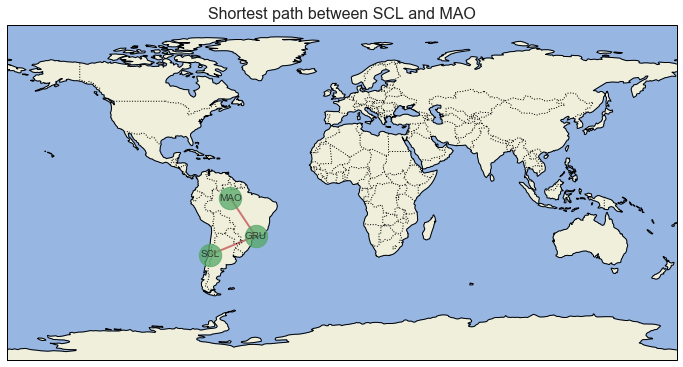

In [90]:
source = 'SCL'
target = 'MAO'
plot_short_route(g, source, target, weight=None)

`The result is rare. Go to Miami, US and from there to Manaus. Total of 10,534Km`

`Let's calculate the short path from Santiago, Chile to Manaus, Brazil but now, using distance ("default") as a weight`


   Shortest path:  ['SCL', 'GRU', 'MAO']


   Track 1: [SCL-GRU] 	Distance: 2614 Km 	Arline: LA / Plane: 763 320 319
   Track 2: [GRU-MAO] 	Distance: 2697 Km 	Arline: KL / Plane: 737


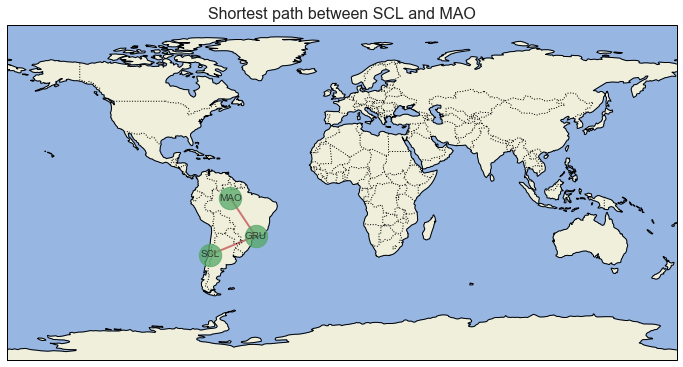

In [91]:
source = 'SCL'
target = 'MAO'
plot_short_route(g, source, target)

`The result is now, very good. Going to Sao Paulo, Brazil and from there to Manaus, makes the trip reduced to half!`

#### Making other tests:


   Shortest path:  ['JFK', 'CDG']


   Track 1: [JFK-CDG] 	Distance: 5834 Km 	Arline: US / Plane: 763 757


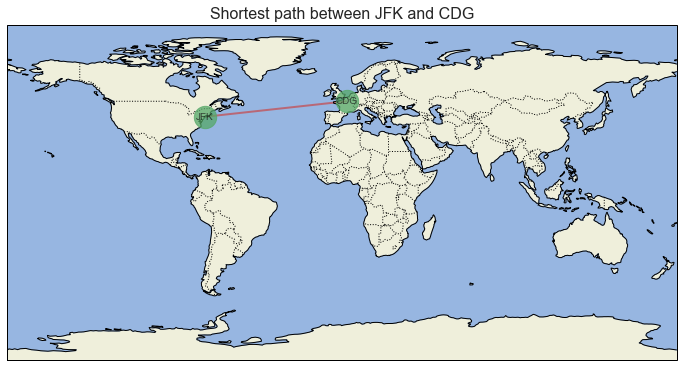

In [92]:
# NYC, US to Paris, France
source = 'JFK'
target = 'CDG'
plot_short_route(g, source, target)


   Shortest path:  ['SCL', 'MEX', 'CJS']


   Track 1: [SCL-MEX] 	Distance: 6597 Km 	Arline: LA / Plane: 763
   Track 2: [MEX-CJS] 	Distance: 1543 Km 	Arline: Y4 / Plane: 319


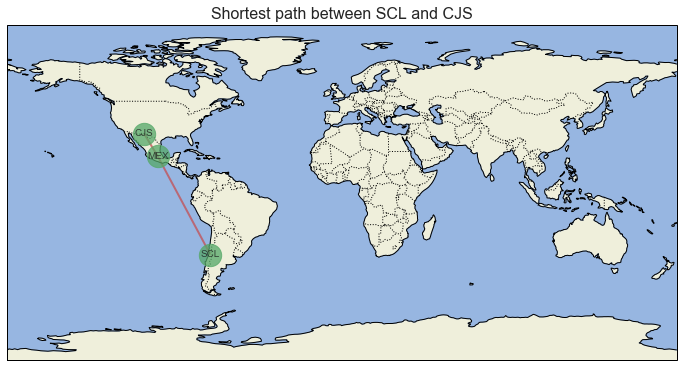

In [93]:
# Santiago, Chile to Ciudad Juarez, Mexico
source = 'SCL'
target = 'CJS'
plot_short_route(g, source, target)


   Shortest path:  ['GIG', 'BOG', 'MDE', 'ADZ']


   Track 1: [GIG-BOG] 	Distance: 4541 Km 	Arline: AV / Plane: 319
   Track 2: [BOG-MDE] 	Distance: 215 Km 	Arline: LA / Plane: 320
   Track 3: [MDE-ADZ] 	Distance: 992 Km 	Arline: CM / Plane: E90


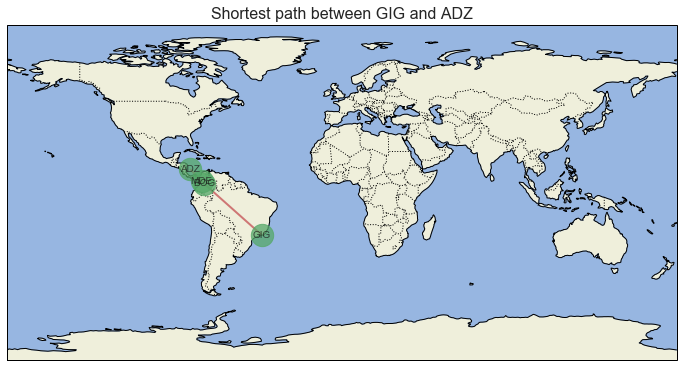

In [94]:
# Rio, Brazil to San Andres, Colombia
source = 'GIG'
target = 'ADZ'
plot_short_route(g, source, target)


   Shortest path:  ['SCL', 'GIG', 'DXB', 'KTM', 'PKR']


   Track 1: [SCL-GIG] 	Distance: 2934 Km 	Arline: LA / Plane: 320 319
   Track 2: [GIG-DXB] 	Distance: 11884 Km 	Arline: EK / Plane: 77W
   Track 3: [DXB-KTM] 	Distance: 2991 Km 	Arline: FZ / Plane: 73H
   Track 4: [KTM-PKR] 	Distance: 146 Km 	Arline: YT / Plane: J41


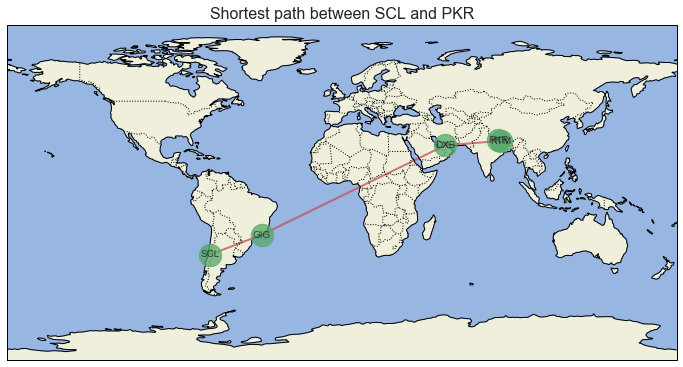

In [95]:
# Santiago, Chile to Pokhara, Nepal
source = 'SCL'
target = 'PKR'
plot_short_route(g, source, target)


   Shortest path:  ['SCL', 'SYD', 'SIN']


   Track 1: [SCL-SYD] 	Distance: 11340 Km 	Arline: QF / Plane: 744
   Track 2: [SYD-SIN] 	Distance: 6293 Km 	Arline: VA / Plane: 773 388 772


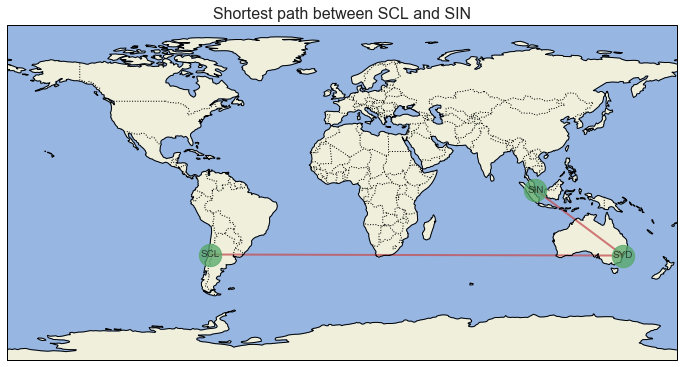

In [96]:
# Santiago, Chile to Singapure
source = 'SCL'
target = 'SIN'
plot_short_route(g, source, target)


   Shortest path:  ['MPN', 'PUQ', 'SCL', 'ATL', 'NRT', 'ITM']


   Track 1: [MPN-PUQ] 	Distance: 851 Km 	Arline: LA / Plane: 320
   Track 2: [PUQ-SCL] 	Distance: 2180 Km 	Arline: LA / Plane: 320
   Track 3: [SCL-ATL] 	Distance: 7588 Km 	Arline: KE / Plane: 76W
   Track 4: [ATL-NRT] 	Distance: 11002 Km 	Arline: DL / Plane: 744
   Track 5: [NRT-ITM] 	Distance: 462 Km 	Arline: NH / Plane: 767 738


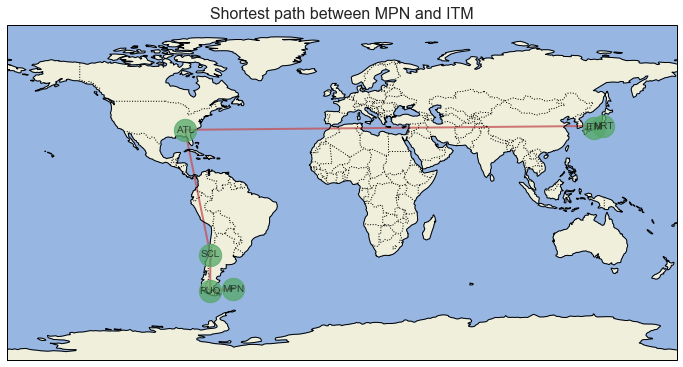

In [97]:
# Mount Pleasant, Falkland Islands: (MPN) to Kioto, Japan (ITM)
source = 'MPN'
target = 'ITM'
plot_short_route(g, source, target, None)

`Here another good one. Going from Aarhus, Denmark to Pokhara, Nepal using real distance as the "weight" on Dijkstra's algorithm, will result on a d=5 (5 legs of trip). If you do not consider the real distance, the number of "legs" will be reduced: d=4, but the total distance will be higher.`


   Shortest path:  ['AAR', 'CPH', 'LHE', 'DEL', 'KTM', 'PKR']


   Track 1: [AAR-CPH] 	Distance: 148 Km 	Arline: SK / Plane: AT7 320 CR2
   Track 2: [CPH-LHE] 	Distance: 5421 Km 	Arline: PK / Plane: 777
   Track 3: [LHE-DEL] 	Distance: 419 Km 	Arline: PK / Plane: 73H
   Track 4: [DEL-KTM] 	Distance: 815 Km 	Arline: SG / Plane: 737
   Track 5: [KTM-PKR] 	Distance: 146 Km 	Arline: YT / Plane: J41


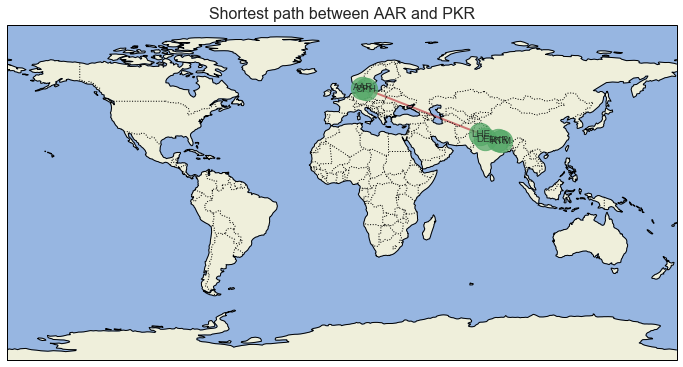

In [98]:
# Aarhus, Denmark to Pokhara, Nepal
source = 'AAR'
target = 'PKR'
plot_short_route(g, source, target)


   Shortest path:  ['AAR', 'OSL', 'BKK', 'KTM', 'PKR']


   Track 1: [AAR-OSL] 	Distance: 434 Km 	Arline: BA / Plane: FRJ
   Track 2: [OSL-BKK] 	Distance: 8671 Km 	Arline: TG / Plane: 773
   Track 3: [BKK-KTM] 	Distance: 2230 Km 	Arline: TG / Plane: 777
   Track 4: [KTM-PKR] 	Distance: 146 Km 	Arline: YT / Plane: J41


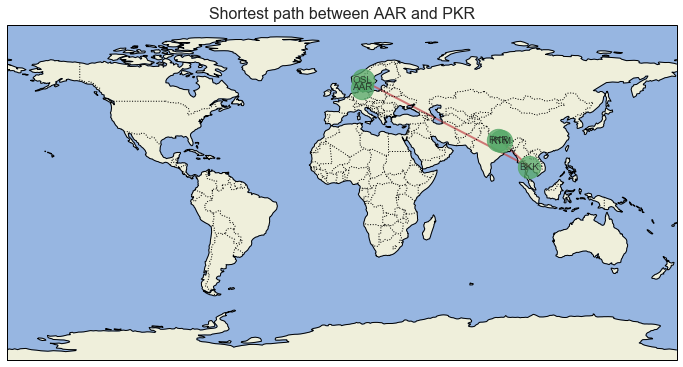

In [99]:
# Aarhus, Denmark to Pokhara, Nepal
source = 'AAR'
target = 'PKR'
plot_short_route(g, source, target, None)

## Part C. Latin America Air Transportation Network 

In [100]:
### Define region to be explored ==> LATAM

airports_latam = airports[(airports.country == 'Brazil')
                       | (airports.country == 'Chile')
                       | (airports.country == 'Argentina')
                       | (airports.country == 'Peru')
                       | (airports.country == 'Bolivia')
                       | (airports.country == 'Colombia')
                       | (airports.country == 'Venezuela')
                       | (airports.country == 'Paraguay')
                       | (airports.country == 'Ecuador')
                       | (airports.country == 'Uruguay')
                       | (airports.country == 'Panama')
                       | (airports.country == 'Costa Rica')
                       | (airports.country == 'Nicaragua')
                       | (airports.country == 'El Salvador')
                       | (airports.country == 'Guatemala')
                       | (airports.country == 'Honduras')
                       | (airports.country == 'Cuba')
                       | (airports.country == 'Dominican Republic')
                       | (airports.country == 'Mexico')]
airports_latam.shape

(829, 13)

In [101]:
# Let's consider only the routes between selected Airports
routes_latam = routes[routes['source'].isin(airports_latam.index)
                   & routes['dest'].isin(airports_latam.index)]
routes_latam.shape

(3379, 5)

In [102]:
### Create a Latam Air Transportation Network for analysis
glt = nx.from_pandas_edgelist(
    routes_latam,
    source='source',
    target='dest',
    create_using=nx.Graph(),
    edge_attr=True)

nx.is_connected(glt)

True

`Here all network is already connected`. 

### Analizing the Network

In [103]:
N_lt, L_lt, kmin_lt, kmax_lt, kmean_lt, aveC_lt, aveL_lt, dmax_lt, degrees_lt, paths_lt, clusters_lt, dg_samples_lt = large_network_analysis(glt)

==> [Network General info] <==

Number of Nodes (N):  395
Number of Links (L):  1042
Min Degree     kmin:  1
Max Degree     kmax:  63
Mean Degree     <k>:  5
Ave Short Path  <d>:  3.47
Diameter       dmax:  7
Ave Clustering  <C>:  0.43


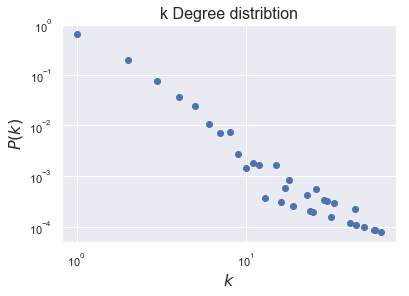

In [104]:
plot_k_distr(degrees_lt)

Degree Exponent: 2.34


Calculating best minimal value for power law fit


2.34

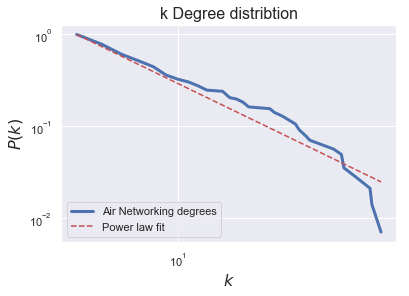

In [105]:
fit_power_law(degrees_lt, 'Air Networking degrees')

`Here the distribution of k does not follow exactly the power law 

kmean =  3.47


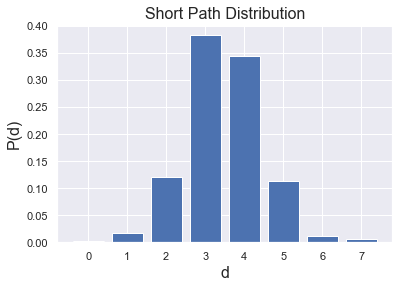

In [106]:
plot_path(paths_lt)

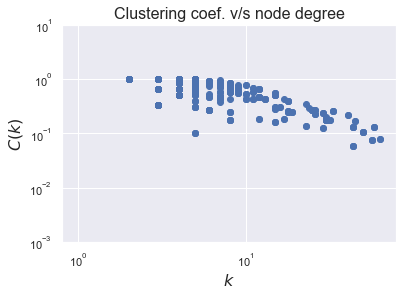

In [107]:
plot_cluster(clusters_lt, dg_samples_lt)

`Clustering coefficient has a faster decrease with higher values of k. Seems that this "subset" of Air Network, does not follow the Small World model as we saw with global network.` 

### Graphing the Network

In [108]:
deg_lt = nx.degree(glt)
sizes_degree_lt = [5 * deg_lt[iata] for iata in glt.nodes]

labels_lt = {iata: iata if deg_lt[iata] >= 20 else ''
          for iata in glt.nodes}

altitude_lt = airports_latam['alt']
altitude_lt = [altitude_lt[iata] for iata in glt.nodes]

country_lt = airports_latam['country']
country_lt = [country_lt[iata] for iata in glt.nodes]

In [109]:
# Top 15 airports regarding its degree of connections:
airp_deg_lt = dict(deg_lt)
sorted(airp_deg_lt.items(),  key=lambda x: x[1], reverse=True)[:15]

[('MEX', 63),
 ('GRU', 58),
 ('BOG', 57),
 ('VCP', 50),
 ('PTY', 45),
 ('LIM', 44),
 ('AEP', 44),
 ('BSB', 41),
 ('GIG', 33),
 ('CNF', 33),
 ('SCL', 32),
 ('CUN', 30),
 ('TIJ', 30),
 ('EZE', 29),
 ('CCS', 29)]

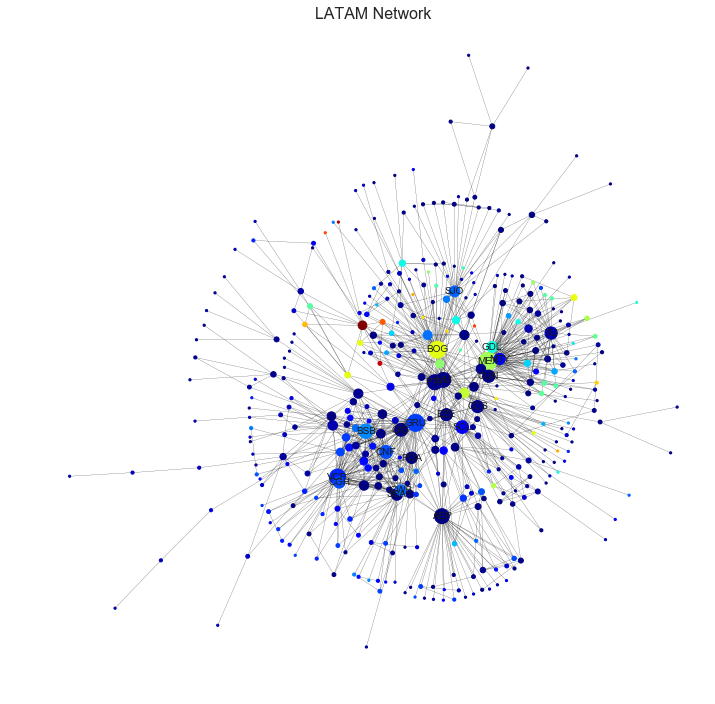

In [110]:
plt.figure(figsize=(12, 12))
plt.axis("off")
plt.title("LATAM Network", fontsize=16)
nx.draw_kamada_kawai(
    glt,
    font_size=10,
    alpha=1,
    width=.2,
    node_size=sizes_degree_lt,
    labels=labels_lt,
    with_labels=True,
    node_color=altitude_lt,
    cmap=plt.get_cmap("jet"))

### Centrality 

In [111]:
betCent_lt = nx.betweenness_centrality(glt, normalized=True, endpoints=True)
node_degree_color_lt = [20000.0 * glt.degree(v) for v in glt]
node_center_size_lt = [v * 10000 for v in betCent_lt.values()]

In [112]:
# Top 15 airports regarding its centrality:

sorted(betCent_lt.items(),  key=lambda x: x[1], reverse=True)[:15]

[('GRU', 0.2340511521244038),
 ('MEX', 0.2112030124469934),
 ('BOG', 0.20925193167729012),
 ('PTY', 0.16729641129835737),
 ('LIM', 0.1299384099675833),
 ('AEP', 0.12652938088995958),
 ('SCL', 0.11227529692730695),
 ('CCS', 0.09117020292523481),
 ('BSB', 0.08823945884064295),
 ('SJO', 0.08586715785175897),
 ('MAO', 0.07504272415757007),
 ('GIG', 0.07171842785344432),
 ('EZE', 0.06807824820275242),
 ('VCP', 0.05263367396056337),
 ('POA', 0.05136212346703632)]

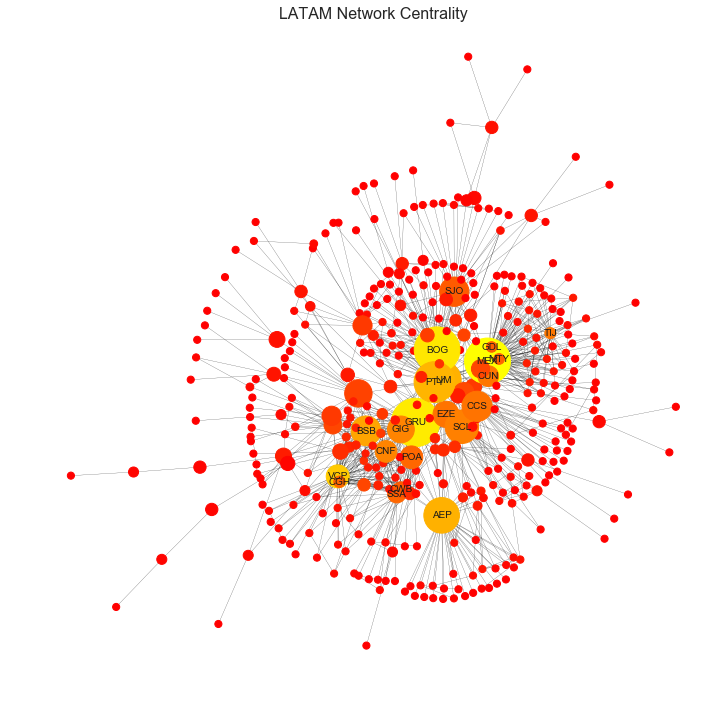

In [113]:
plt.figure(figsize=(12, 12))
plt.title("LATAM Network Centrality", fontsize=16)
plt.axis('off')
nx.draw_kamada_kawai(
    glt,
    font_size=10,
    alpha=1,
    width=.2,
    node_size=node_center_size_lt,
    labels=labels_lt,
    with_labels=True,
    node_color=node_degree_color_lt,
    cmap=plt.cm.autumn)

`It is clear looking on the above graph that there are a lot of "extremely fragile star-like periphery" connections (5), with high centrality (size of node), but that do not belong to the core (airports with high k and with label)`

### Community Detection

In [114]:
com_parts_lt = community.best_partition(glt)
com_values_lt = [com_parts_lt.get(node) for node in glt.nodes()]
print("Comunities: ", set(com_parts_lt.values()))

Comunities:  {0, 1, 2, 3, 4, 5, 6, 7, 8, 9}


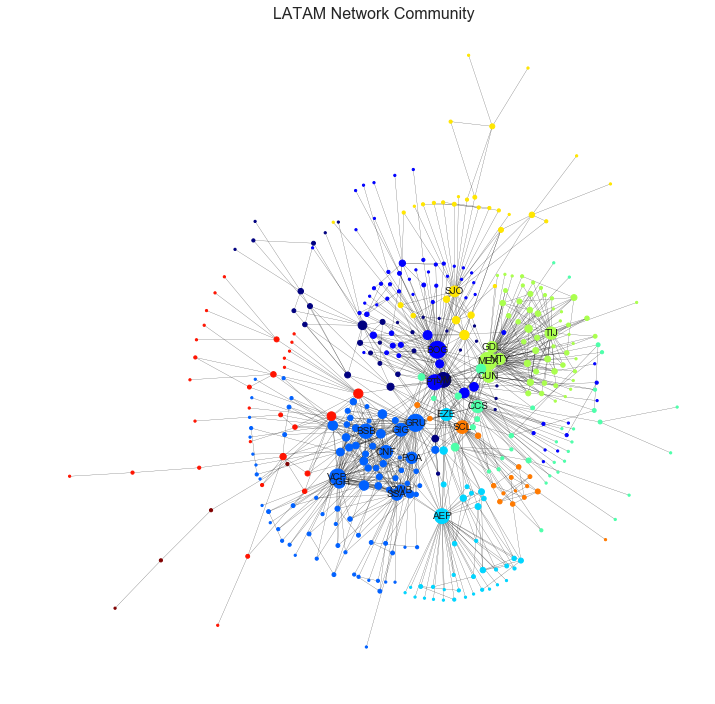

In [115]:
fig = plt.figure(figsize=(12, 12))
plt.title("LATAM Network Community", fontsize=16)
plt.axis("off")
nx.draw_kamada_kawai(
    glt,
    font_size=10,
    alpha=1,
    width=.2,
    labels=labels_lt,
    with_labels=True,
    node_color=com_values_lt,
    node_size=sizes_degree_lt,
    cmap=plt.get_cmap("jet"))

### Mapping 

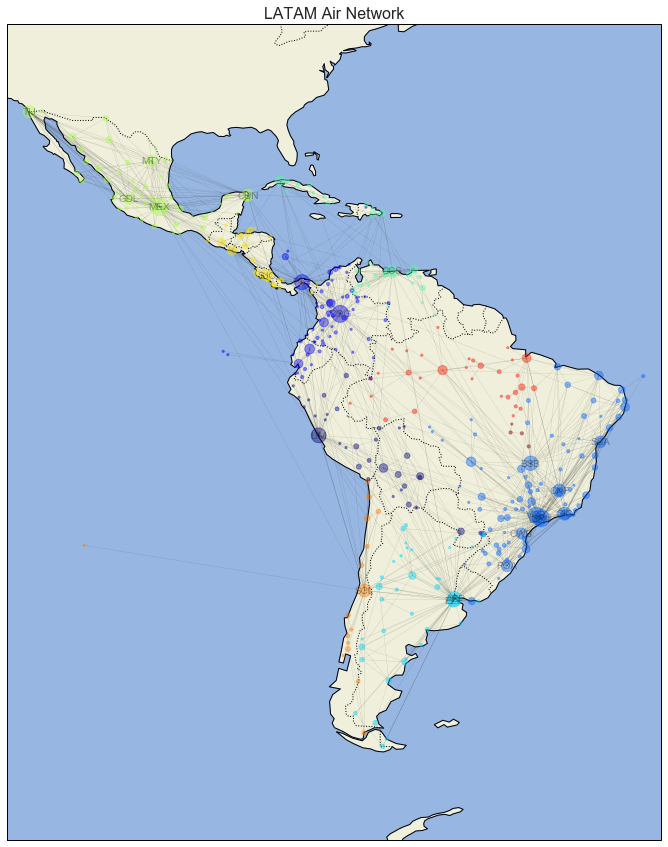

In [116]:
latam = [-30, -120, 35, -60]
plot_net_map(
    glt,
    labels_lt,
    title = ("LATAM Air Network"), 
    map_range=latam,
    node_color=com_values_lt,
    node_size=sizes_degree_lt,
    figsize=(15, 15),
    cmap=plt.get_cmap("jet"))

`Here is evident that a lot more than geography take a part on community detection. Pay attention that Cuba and Venezuela has a particular network (yellow color). A lot of politics involved.`

---

## Part D. Studing a particular Air Company

`Define Airline Company to be explored, in our case, LATAM Airlines (Merge of Chilean LAN and Brazilian TAM)`

Looking for IATA codes at [LATAM Arlines Group at Wikipedia](https://en.wikipedia.org/wiki/LATAM_Airlines_Group):

- LATAM Argentina: 4M
- LATAM Brasil: JJ
- LATAM Chile: LA
- LATAM Colombia: 4C
- LATAM Ecuador: XL
- LATAM Paraguay: PZ
- Latam Peru: LP

In [117]:
routes_latam = routes_rg[(routes_rg.airline == '4M')
                         | (routes_rg.airline == 'JJ')
                         | (routes_rg.airline == 'LA')
                         | (routes_rg.airline == '4C')
                         | (routes_rg.airline == 'XL')
                         | (routes_rg.airline == 'PZ')
                         | (routes_rg.airline == 'LP')]
routes_latam.shape

(659, 5)

In [118]:
routes_latam.sample(5)

,airline,source,dest,equipment,dist
37774,LA,SCL,ASU,320,1571
37583,LA,BOG,BGA,320,290
34188,JJ,BVB,MAO,320,658
37627,LA,CUN,MIA,763,855
34447,JJ,SSA,GIG,320 321,1218


In [119]:
routes_latam.airline.value_counts()

JJ    332
LA    285
PZ     18
XL     14
4M     10
Name: airline, dtype: int64

In [120]:
### Create a Latam Airline Network for analysis
g_latam = nx.from_pandas_edgelist(
    routes_latam,
    source='source',
    target='dest',
    create_using=nx.Graph(),
    edge_attr=True)

nx.is_connected(g_latam)

True

In [121]:
### Analizing the Network

N_latam, L_latam, kmin_latam, kmax_latam, kmean_latam, aveC_latam, aveL_latam, dmax_latam, degrees_latam, paths_latam, clusters_latam, dg_samples_latam = large_network_analysis(
    g_latam)

==> [Network General info] <==

Number of Nodes (N):  145
Number of Links (L):  312
Min Degree     kmin:  1
Max Degree     kmax:  50
Mean Degree     <k>:  4
Ave Short Path  <d>:  2.86
Diameter       dmax:  6
Ave Clustering  <C>:  0.37


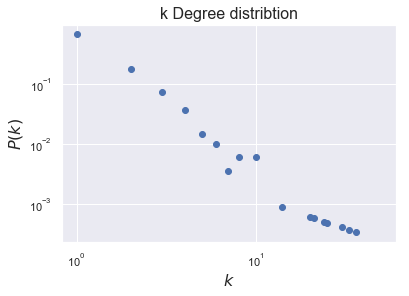

In [122]:
plot_k_distr(degrees_latam)

Degree Exponent: 2.48


Calculating best minimal value for power law fit


2.48

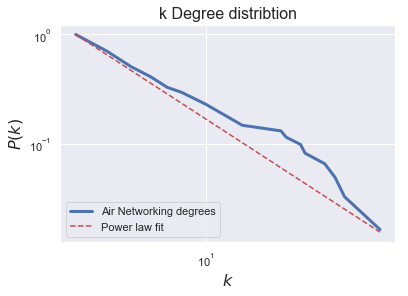

In [123]:
fit_power_law(degrees_latam, 'Air Networking degrees')

kmean =  2.86


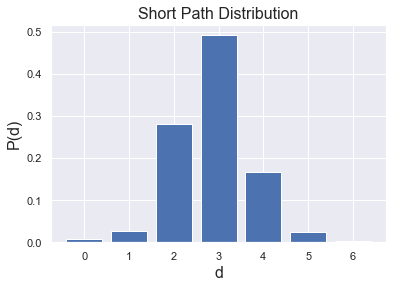

In [124]:
plot_path(paths_latam)

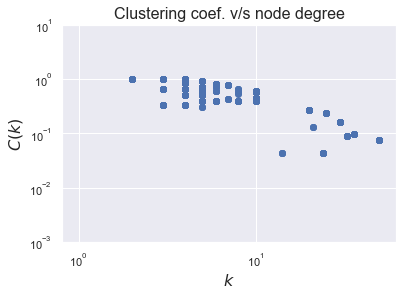

In [125]:
plot_cluster(clusters_latam, dg_samples_latam)

In [126]:
# Graphing the Network

deg_latam = nx.degree(g_latam)

In [127]:
sizes_degree_latam = [5 * deg_latam[iata] for iata in g_latam.nodes]

In [128]:
labels_latam = {iata: iata if deg_latam[iata] >= 10 else ''
          for iata in g_latam.nodes}

In [129]:
# Top 15 airports regarding its degree of connections:
airp_deg_latam = dict(deg_latam)
sorted(airp_deg_latam.items(),  key=lambda x: x[1], reverse=True)[:15]

[('GRU', 50),
 ('SCL', 36),
 ('LIM', 33),
 ('BSB', 30),
 ('GIG', 25),
 ('BOG', 24),
 ('CGH', 21),
 ('MIA', 20),
 ('AEP', 14),
 ('EZE', 10),
 ('SSA', 10),
 ('BEL', 10),
 ('FOR', 10),
 ('GYE', 10),
 ('MAO', 8)]

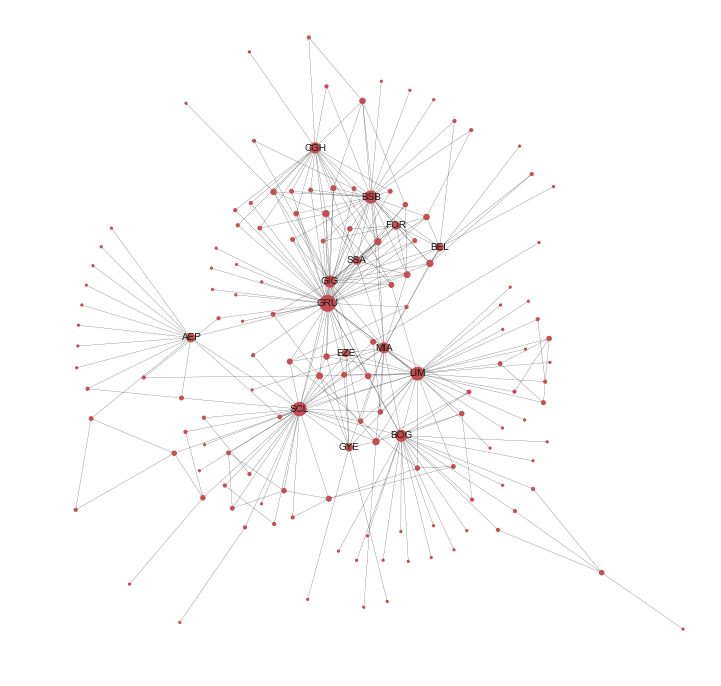

In [130]:
plt.figure(figsize=(12, 12))
plt.axis("off")
nx.draw_kamada_kawai(
    g_latam,
    font_size=10,
    alpha=1,
    width=.2,
    node_size=sizes_degree_latam,
    labels=labels_latam,
    with_labels=True,
    node_color='r',
    cmap=plt.get_cmap("jet"))

In [131]:
### Centrality 

betCent_latam = nx.betweenness_centrality(g_latam, normalized=True, endpoints=True)
node_degree_color_latam = [20000.0 * g_latam.degree(v) for v in g_latam]
node_center_size_latam = [v * 10000 for v in betCent_latam.values()]

# Top 15 airports regarding its centrality:

sorted(betCent_latam.items(),  key=lambda x: x[1], reverse=True)[:15]

[('GRU', 0.4363087228327139),
 ('SCL', 0.32139783614152156),
 ('BOG', 0.2618580094873202),
 ('LIM', 0.2477450314673942),
 ('AEP', 0.1450952283361245),
 ('MIA', 0.10630993191304082),
 ('BSB', 0.10427980167706748),
 ('GIG', 0.06943824990030203),
 ('CGH', 0.04885321979980472),
 ('GYE', 0.04155810983397191),
 ('BEL', 0.039970896095177726),
 ('MAO', 0.03418703143918662),
 ('UIO', 0.031641656023839955),
 ('MAD', 0.028292569201333592),
 ('POA', 0.028131566689593476)]

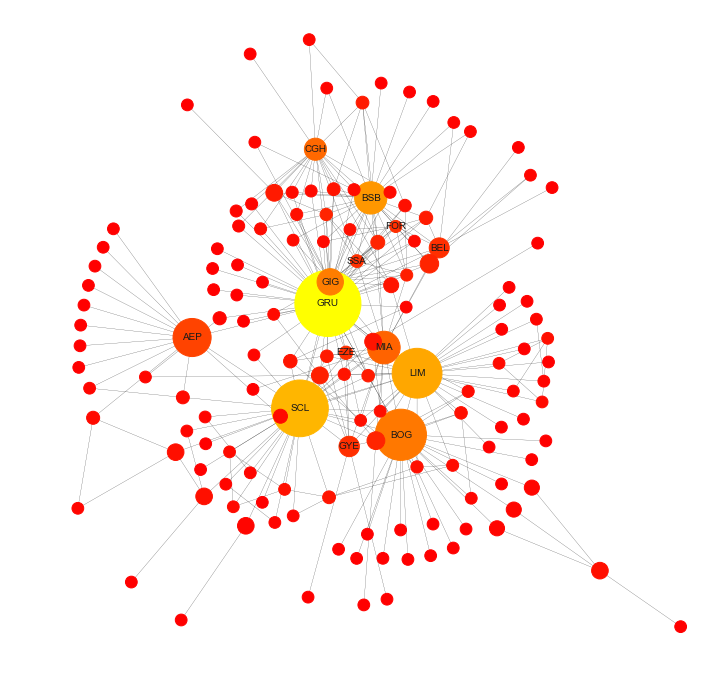

In [132]:
plt.figure(figsize=(12, 12))
plt.axis('off')
nx.draw_kamada_kawai(
    g_latam,
    font_size=10,
    alpha=1,
    width=.2,
    node_size=node_center_size_latam,
    labels=labels_latam,
    with_labels=True,
    node_color=node_degree_color_latam,
    cmap=plt.cm.autumn)

In [133]:
### Community Detection

com_parts_latam = community.best_partition(g_latam)
com_values_latam = [com_parts_latam.get(node) for node in g_latam.nodes()]
print("Comunities: ", set(com_parts_latam.values()))

Comunities:  {0, 1, 2, 3, 4, 5}


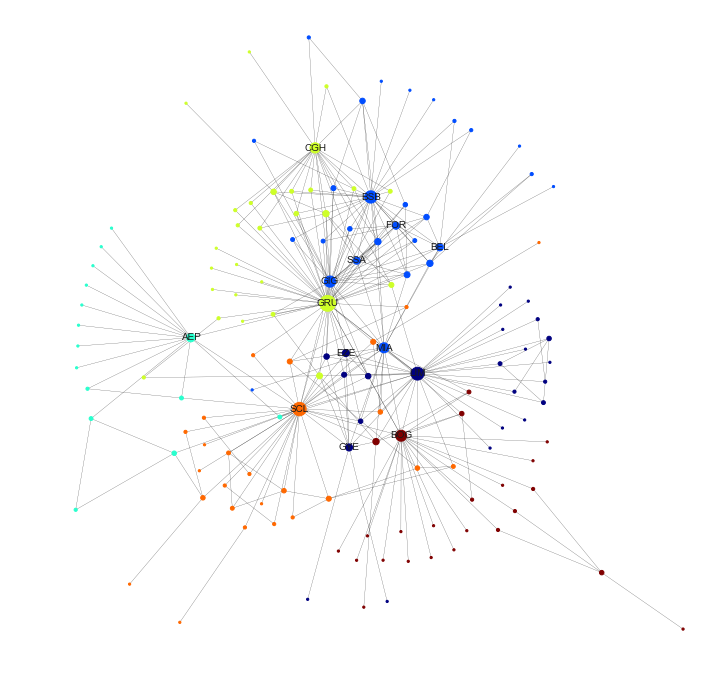

In [134]:
fig = plt.figure(figsize=(12, 12))
plt.axis("off")
nx.draw_kamada_kawai(
    g_latam,
    font_size=10,
    alpha=1,
    width=.2,
    labels=labels_latam,
    with_labels=True,
    node_color=com_values_latam,
    node_size=sizes_degree_latam,
    cmap=plt.get_cmap("jet"))

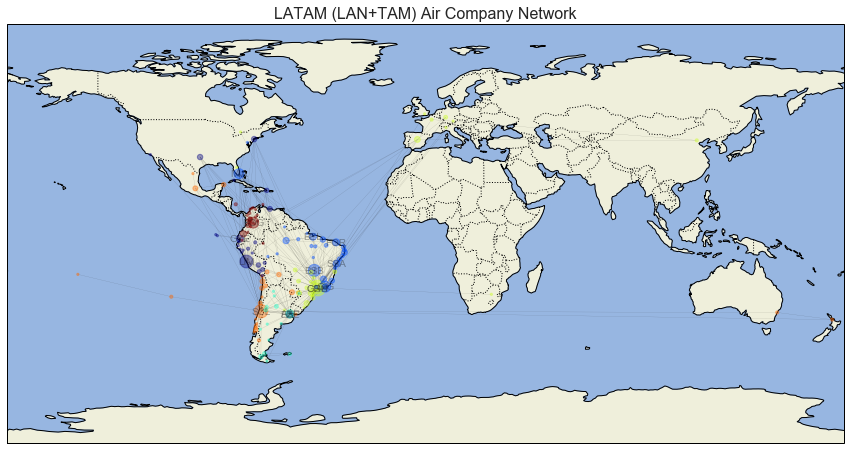

In [135]:
# Mapping 
plot_net_map(
    g_latam,
    labels_latam,
    title = ("LATAM (LAN+TAM) Air Company Network"), 
    node_color=com_values_latam,
    node_size=sizes_degree_latam,
    figsize=(15, 15),
    cmap=plt.get_cmap("jet"))

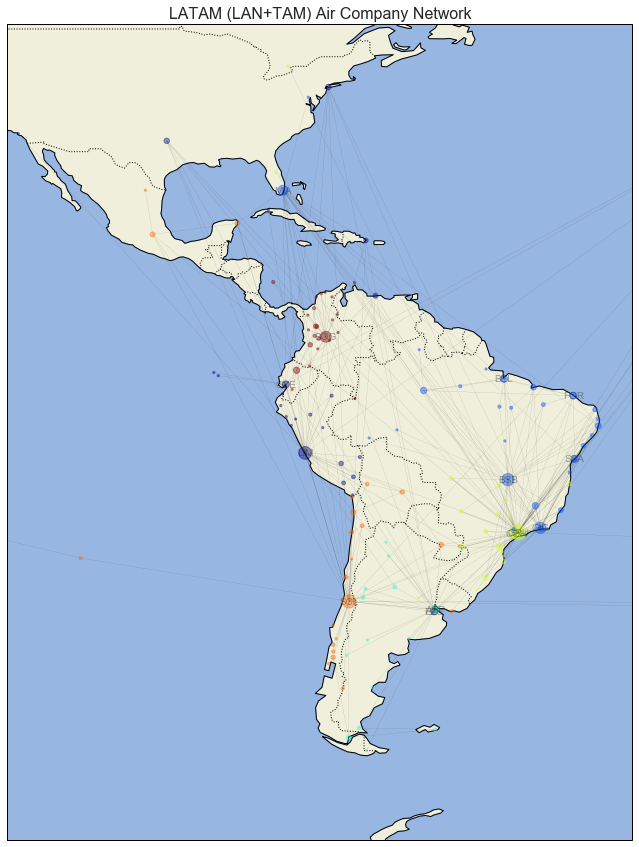

In [136]:
### Mapping 

latam = [-30, -120, 40, -60]
plot_net_map(
    g_latam,
    labels_latam,
    title = ("LATAM (LAN+TAM) Air Company Network"), 
    map_range=latam,
    node_color=com_values_latam,
    node_size=sizes_degree_latam,
    figsize=(15, 15),
    cmap=plt.get_cmap("jet"))

`It is important to note that the network of LATAM, which is a major airline, is centered around few main airports (hubs). This is also observed for LUFTHANSA as shown at (6), where the authors also comment that the structure of of low-cost airlines, as Ryanair, the biggest European low-cost company, has a densely connected core. Let's also check it:`

`Ryanair IATA code: FR`

In [137]:
routes_Ryanair = routes_rg[(routes_rg.airline == 'FR')]
routes_Ryanair.shape

(2482, 5)

In [138]:
routes_Ryanair.sample(5)

,airline,source,dest,equipment,dist
27557,FR,PIK,RIX,738,1760
27672,FR,PSA,SUF,738,722
27081,FR,LBA,FUE,738,2995
26100,FR,BLL,AHO,738,1681
27030,FR,KRK,DTM,738,869


In [139]:
# Create a Ryanair Airline Network for analysis
g_Ryanair = nx.from_pandas_edgelist(
    routes_Ryanair,
    source='source',
    target='dest',
    create_using=nx.Graph(),
    edge_attr=True)

nx.is_connected(g_Ryanair)

True

In [140]:
# Analizing the Network
N_Ryanair, L_Ryanair, kmin_Ryanair, kmax_Ryanair, kmean_Ryanair, aveC_Ryanair, aveL_Ryanair, dmax_Ryanair, degrees_Ryanair, paths_Ryanair, clusters_Ryanair, dg_samples_Ryanair = large_network_analysis(
    g_Ryanair)

==> [Network General info] <==

Number of Nodes (N):  175
Number of Links (L):  1241
Min Degree     kmin:  1
Max Degree     kmax:  123
Mean Degree     <k>:  14
Ave Short Path  <d>:  2.14
Diameter       dmax:  4
Ave Clustering  <C>:  0.39


In [141]:
# Graphing the Network

deg_Ryanair = nx.degree(g_Ryanair)

sizes_degree_Ryanair = [5 * deg_Ryanair[iata] for iata in g_Ryanair.nodes]

labels_Ryanair = {iata: iata if deg_Ryanair[iata] >= 10 else ''
          for iata in g_Ryanair.nodes}

In [142]:
# Top 15 airports regarding its degree of connections:
airp_deg_Ryanair = dict(deg_Ryanair)
sorted(airp_deg_Ryanair.items(),  key=lambda x: x[1], reverse=True)[:15]

[('STN', 123),
 ('DUB', 76),
 ('CRL', 75),
 ('BGY', 63),
 ('AGP', 50),
 ('PMI', 49),
 ('BVA', 46),
 ('CIA', 45),
 ('GRO', 44),
 ('HHN', 43),
 ('PSA', 43),
 ('ALC', 42),
 ('BCN', 39),
 ('NRN', 38),
 ('EMA', 37)]

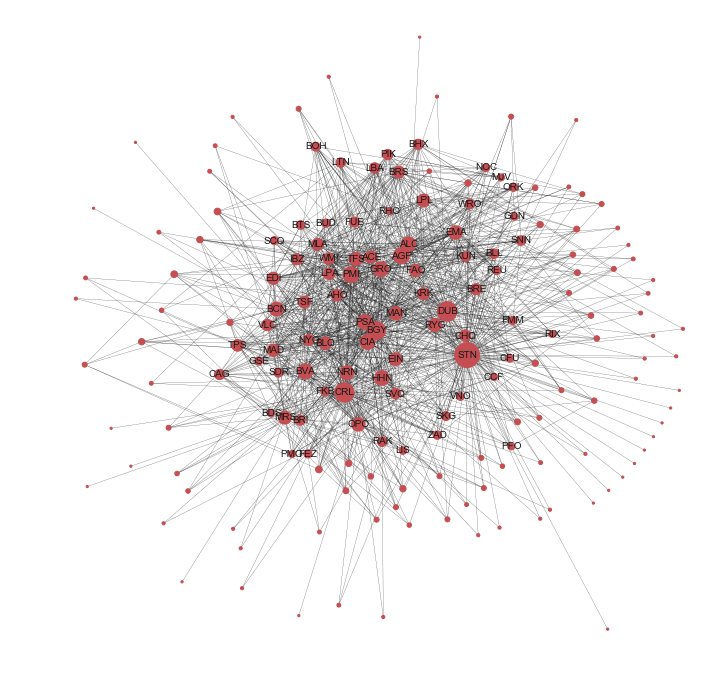

In [143]:
plt.figure(figsize=(12, 12))
plt.axis("off")
nx.draw_kamada_kawai(
    g_Ryanair,
    font_size=10,
    alpha=1,
    width=.2,
    node_size=sizes_degree_Ryanair,
    labels=labels_Ryanair,
    with_labels=True,
    node_color='r',
    cmap=plt.get_cmap("jet"))

In [144]:
# Centrality 

betCent_Ryanair = nx.betweenness_centrality(g_Ryanair, normalized=True, endpoints=True)
node_degree_color_Ryanair = [20000.0 * g_Ryanair.degree(v) for v in g_Ryanair]
node_center_size_Ryanair = [v * 10000 for v in betCent_Ryanair.values()]

In [145]:
# Top 15 airports regarding its centrality:

sorted(betCent_Ryanair.items(),  key=lambda x: x[1], reverse=True)[:15]

[('STN', 0.36519897340850815),
 ('CRL', 0.11702118468524322),
 ('DUB', 0.0915435148845633),
 ('OPO', 0.056871855680767316),
 ('MRS', 0.05507051810345136),
 ('BGY', 0.05171263431508459),
 ('BCN', 0.04774554192335167),
 ('GRO', 0.04357178466141657),
 ('AGP', 0.04149057498290512),
 ('PMI', 0.03905838490884553),
 ('ALC', 0.0379688241225614),
 ('HHN', 0.0357026928432443),
 ('BVA', 0.03041437209899479),
 ('PSA', 0.02634514926044154),
 ('NYO', 0.026096578835097726)]

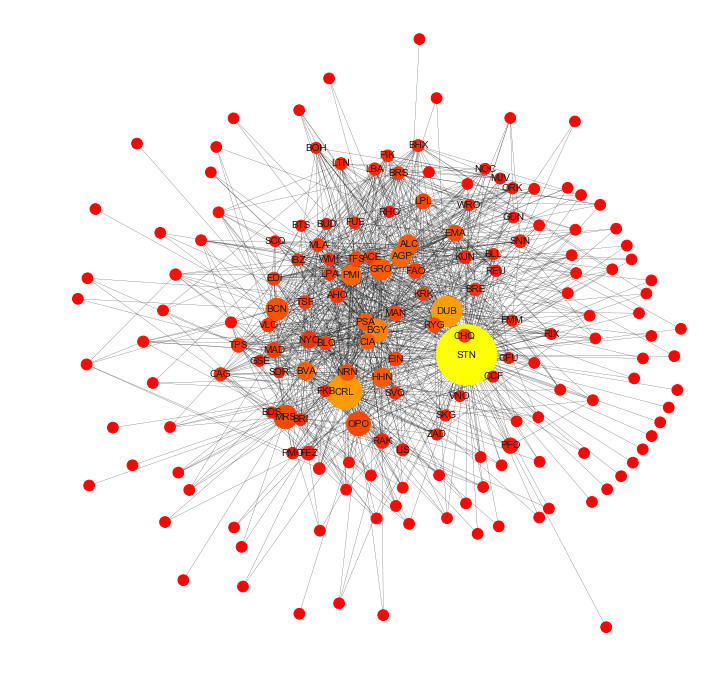

In [146]:
plt.figure(figsize=(12, 12))
plt.axis('off')
nx.draw_kamada_kawai(
    g_Ryanair,
    font_size=10,
    alpha=1,
    width=.2,
    node_size=node_center_size_Ryanair,
    labels=labels_Ryanair,
    with_labels=True,
    node_color=node_degree_color_Ryanair,
    cmap=plt.cm.autumn)

Comunities:  {0, 1, 2, 3, 4, 5}


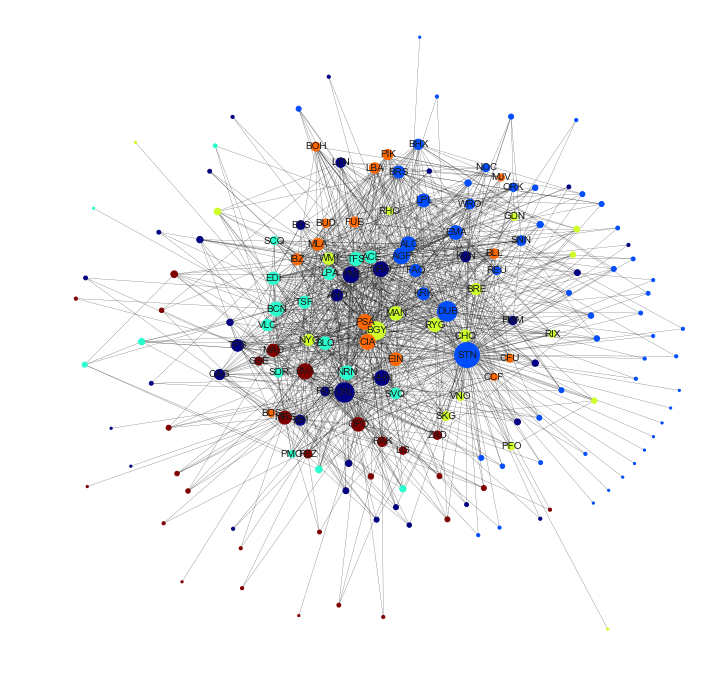

In [147]:
# Community Detection
com_parts_Ryanair = community.best_partition(g_Ryanair)
com_values_Ryanair = [com_parts_Ryanair.get(node) for node in g_Ryanair.nodes()]
print("Comunities: ", set(com_parts_Ryanair.values()))

fig = plt.figure(figsize=(12, 12))
plt.axis("off")
nx.draw_kamada_kawai(g_Ryanair,
               font_size=10,
               alpha=1,
               width=.2,
               labels=labels_Ryanair,
               with_labels=True,
               node_color=com_values_Ryanair,
               node_size=sizes_degree_Ryanair,
               cmap=plt.get_cmap("jet")
               )

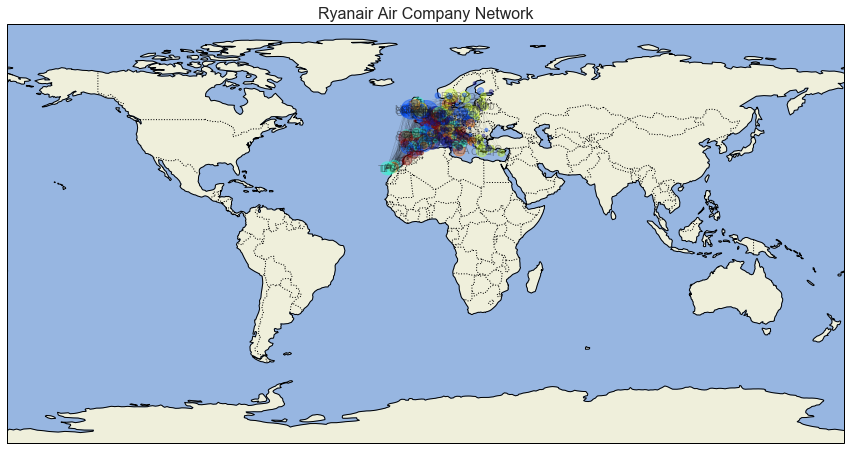

In [148]:
# Mapping 
plot_net_map(
    g_Ryanair,
    labels_Ryanair,
    title = ("Ryanair Air Company Network"), 
    node_color=com_values_Ryanair,
    node_size=sizes_degree_Ryanair,
    figsize=(15, 15),
    cmap=plt.get_cmap("jet"))

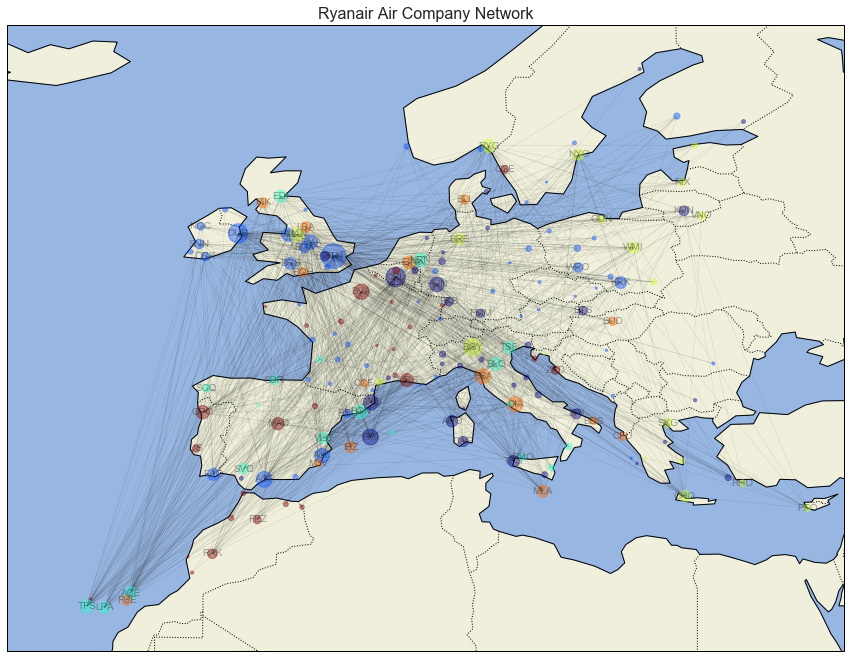

In [149]:
### Mapping 

europe = [-22, 35, 65, 25]
plot_net_map(
    g_Ryanair,
    labels_Ryanair,
    title = ("Ryanair Air Company Network"), 
    map_range=europe,
    node_color=com_values_Ryanair,
    node_size=sizes_degree_Ryanair,
    figsize=(15, 15),
    cmap=plt.get_cmap("jet"))

`The analysis shown here, proves what is described on (6), that the structure of of low-cost airlines, as Ryanair, the biggest European low-cost company, has a densely connected core, in opposition to LATAM or LUFTHANSA`